# Discogs Analysis


[Discogs Developer](https://www.discogs.com/developers/#page:home,header:home-quickstart)

[Download Discogs Data](https://data.discogs.com/)

[Discogs Database Search](https://www.discogs.com/developers/#page:database,header:database-search)

[Discogs Oauth](https://github.com/jesseward/discogs-oauth-example)

Need data on location of purchase

### Key Questions to answer:

* What is the profile of my record collection?

* What are the most expensive records and CDs I own?

* Which band/artist do I own the most and what is the cost of that?

* Which record label do I support the most and which did I spent the most?

* Which subgenre costs the most and which one is worth the most?

* Is there a difference between autographed and non-authographed records?

* What is the breakdown of the format and the cost, min price, median price, and max price?

In [117]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import pandas_profiling
import seaborn as sns
#import cufflinks as cf
import plotly.offline
#cf.go_offline()
#cf.set_config_file(offline=False, world_readable=True)
from pylab import rcParams
sns.set(rc={'figure.figsize':(16,12)})
plt.style.use('ggplot')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_row', None)

In [2]:
discogs_df = pd.read_csv('../data/discogs_data.csv')
discogs_df.head(10)

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Rating,Released,release_id,CollectionFolder,Date Added,Collection Media Condition,Collection Sleeve Condition,Collection Notes,Collection Cost,Collection Autographed,Min,Median,Max,Genre,Subgenre
0,33,SD 8283,Yes,Yes,The Yes Album,Atlantic,"LP, Album, RE, PR;",NaN,1971,7116823.0,Vinyl,7/21/19 20:21,NaN,NaN,NaN,5.50,NaN,2.25,3.87,10.00,Rock,Progressive Rock
1,165,RR 6583-1,Mastodon,Mastodon,Remission,Relapse Records,"2x12"", Album, RE, RM, RP",NaN,2017,8863478.0,Vinyl,12/3/16 11:44,NaN,NaN,NaN,15.00,NaN,7.99,21.67,30.19,Metal,Sludge Metal
2,373,CS 8192,The Dave Brubeck Quartet,The Dave Brubeck Quartet,Time Out,Columbia,"LP, Album",NaN,1961,2676016.0,Vinyl,5/5/14 21:16,NaN,NaN,NaN,20.00,NaN,5.07,26.50,130.00,Jazz,Jazz
3,142,SD 3-100,Yes,Yes,Yessongs,Atlantic,"3xLP, Album",5.0,1973,8179158.0,Vinyl,4/20/17 19:05,NaN,NaN,NaN,5.00,NaN,3.95,9.99,20.00,Rock,Progressive Rock
4,18,SD 2-908,Yes,Yes,Tales From Topographic Oceans,Atlantic,"2xLP, Album, Gat",NaN,1973,8535940.0,Vinyl,2/22/20 15:50,NaN,NaN,NaN,5.50,NaN,7.99,13.49,20.00,Rock,Progressive Rock
5,340,SD 18122,Yes,Yes,Relayer,Atlantic,"LP, Album, Gat",NaN,1974,755646.0,Vinyl,9/6/14 11:59,NaN,NaN,NaN,4.00,NaN,1.13,7.00,30.74,Rock,Progressive Rock
6,374,SD 8245,King Crimson,King Crimson,In The Court Of The Crimson King An Observati...,Atlantic,"LP, Album, RE, PRC",NaN,1975,4254321.0,Vinyl,5/5/14 21:14,NaN,NaN,NaN,12.00,NaN,10.00,17.00,25.00,Rock,Progressive Rock
7,255,"34224, PZ 34224",Kansas (2),Kansas (2),Leftoverture,"Kirshner, Kirshner","LP, Album",3.0,1976,1476710.0,Vinyl,8/9/15 18:25,NaN,NaN,NaN,0.86,NaN,1.72,3.82,9.95,Rock,Classic Rock
8,341,SD 19132,Yes,Yes,Fragile,Atlantic,"LP, Album, RE, SRC",NaN,1977,2637700.0,Vinyl,9/6/14 11:59,NaN,NaN,NaN,4.00,NaN,4.50,7.25,14.00,Rock,Progressive Rock
9,19,AFL1-3516,Scorpions,Scorpions,Best Of Scorpions,RCA Victor,"LP, Comp",NaN,1979,3632339.0,Vinyl,2/22/20 15:47,NaN,NaN,NaN,2.00,NaN,4.50,7.99,14.99,Metal,Heavy Metal


Some of the labels are separated by commas.

In [3]:
discogs_df = pd.concat([discogs_df, discogs_df['Label'].str.split(', ', expand=True)], axis=1)
discogs_df.head(20)

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Rating,Released,release_id,CollectionFolder,Date Added,Collection Media Condition,Collection Sleeve Condition,Collection Notes,Collection Cost,Collection Autographed,Min,Median,Max,Genre,Subgenre,0,1,2,3
0,33,SD 8283,Yes,Yes,The Yes Album,Atlantic,"LP, Album, RE, PR;",NaN,1971,7116823.0,Vinyl,7/21/19 20:21,NaN,NaN,NaN,5.50,NaN,2.25,3.87,10.00,Rock,Progressive Rock,Atlantic,None,None,None
1,165,RR 6583-1,Mastodon,Mastodon,Remission,Relapse Records,"2x12"", Album, RE, RM, RP",NaN,2017,8863478.0,Vinyl,12/3/16 11:44,NaN,NaN,NaN,15.00,NaN,7.99,21.67,30.19,Metal,Sludge Metal,Relapse Records,None,None,None
2,373,CS 8192,The Dave Brubeck Quartet,The Dave Brubeck Quartet,Time Out,Columbia,"LP, Album",NaN,1961,2676016.0,Vinyl,5/5/14 21:16,NaN,NaN,NaN,20.00,NaN,5.07,26.50,130.00,Jazz,Jazz,Columbia,None,None,None
3,142,SD 3-100,Yes,Yes,Yessongs,Atlantic,"3xLP, Album",5.0,1973,8179158.0,Vinyl,4/20/17 19:05,NaN,NaN,NaN,5.00,NaN,3.95,9.99,20.00,Rock,Progressive Rock,Atlantic,None,None,None
4,18,SD 2-908,Yes,Yes,Tales From Topographic Oceans,Atlantic,"2xLP, Album, Gat",NaN,1973,8535940.0,Vinyl,2/22/20 15:50,NaN,NaN,NaN,5.50,NaN,7.99,13.49,20.00,Rock,Progressive Rock,Atlantic,None,None,None
5,340,SD 18122,Yes,Yes,Relayer,Atlantic,"LP, Album, Gat",NaN,1974,755646.0,Vinyl,9/6/14 11:59,NaN,NaN,NaN,4.00,NaN,1.13,7.00,30.74,Rock,Progressive Rock,Atlantic,None,None,None
6,374,SD 8245,King Crimson,King Crimson,In The Court Of The Crimson King An Observati...,Atlantic,"LP, Album, RE, PRC",NaN,1975,4254321.0,Vinyl,5/5/14 21:14,NaN,NaN,NaN,12.00,NaN,10.00,17.00,25.00,Rock,Progressive Rock,Atlantic,None,None,None
7,255,"34224, PZ 34224",Kansas (2),Kansas (2),Leftoverture,"Kirshner, Kirshner","LP, Album",3.0,1976,1476710.0,Vinyl,8/9/15 18:25,NaN,NaN,NaN,0.86,NaN,1.72,3.82,9.95,Rock,Classic Rock,Kirshner,Kirshner,None,None
8,341,SD 19132,Yes,Yes,Fragile,Atlantic,"LP, Album, RE, SRC",NaN,1977,2637700.0,Vinyl,9/6/14 11:59,NaN,NaN,NaN,4.00,NaN,4.50,7.25,14.00,Rock,Progressive Rock,Atlantic,None,None,None
9,19,AFL1-3516,Scorpions,Scorpions,Best Of Scorpions,RCA Victor,"LP, Comp",NaN,1979,3632339.0,Vinyl,2/22/20 15:47,NaN,NaN,NaN,2.00,NaN,4.50,7.99,14.99,Metal,Heavy Metal,RCA Victor,None,None,None


Rename columns

In [4]:
discogs_df.rename(columns={0:'Label1',1:'Label2',2:'Label3',3:'Label4'}, inplace=True)
discogs_df.head()

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Rating,Released,release_id,CollectionFolder,Date Added,Collection Media Condition,Collection Sleeve Condition,Collection Notes,Collection Cost,Collection Autographed,Min,Median,Max,Genre,Subgenre,Label1,Label2,Label3,Label4
0,33,SD 8283,Yes,Yes,The Yes Album,Atlantic,"LP, Album, RE, PR;",NaN,1971,7116823.0,Vinyl,7/21/19 20:21,NaN,NaN,NaN,5.5,NaN,2.25,3.87,10.00,Rock,Progressive Rock,Atlantic,None,None,None
1,165,RR 6583-1,Mastodon,Mastodon,Remission,Relapse Records,"2x12"", Album, RE, RM, RP",NaN,2017,8863478.0,Vinyl,12/3/16 11:44,NaN,NaN,NaN,15.0,NaN,7.99,21.67,30.19,Metal,Sludge Metal,Relapse Records,None,None,None
2,373,CS 8192,The Dave Brubeck Quartet,The Dave Brubeck Quartet,Time Out,Columbia,"LP, Album",NaN,1961,2676016.0,Vinyl,5/5/14 21:16,NaN,NaN,NaN,20.0,NaN,5.07,26.50,130.00,Jazz,Jazz,Columbia,None,None,None
3,142,SD 3-100,Yes,Yes,Yessongs,Atlantic,"3xLP, Album",5.0,1973,8179158.0,Vinyl,4/20/17 19:05,NaN,NaN,NaN,5.0,NaN,3.95,9.99,20.00,Rock,Progressive Rock,Atlantic,None,None,None
4,18,SD 2-908,Yes,Yes,Tales From Topographic Oceans,Atlantic,"2xLP, Album, Gat",NaN,1973,8535940.0,Vinyl,2/22/20 15:50,NaN,NaN,NaN,5.5,NaN,7.99,13.49,20.00,Rock,Progressive Rock,Atlantic,None,None,None


Export for inspection

In [5]:
discogs_df.to_csv('../output/discogs_clean_data.csv',index=False)

## Label Sorting

Label must be sorted. There is an issue like this where Svart Records is placed before 20 Buck Spin

In [6]:
twentybuck = discogs_df[discogs_df['Label'].str.contains("20 Buck Spin")]
twentybuck

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Rating,Released,release_id,CollectionFolder,Date Added,Collection Media Condition,Collection Sleeve Condition,Collection Notes,Collection Cost,Collection Autographed,Min,Median,Max,Genre,Subgenre,Label1,Label2,Label3,Label4
154,88,SPIN065,Mournful Congregation,Mournful Congregation,Concrescence Of The Sophia,20 Buck Spin,"LP, MiniAlbum",NaN,2014,5807031.0,Vinyl,6/3/18 15:21,NaN,NaN,NaN,17.0,NaN,6.00,9.00,15.99,Metal,Doom Metal,20 Buck Spin,None,None,None
215,156,SPIN075,Khemmis,Khemmis,Absolution,20 Buck Spin,"LP, Album, RP",NaN,2015,8551023.0,Vinyl,1/18/17 15:05,NaN,NaN,NaN,18.0,Yes,10.00,19.49,24.99,Metal,Doom Metal,20 Buck Spin,None,None,None
239,213,SPIN048,Pallbearer,Pallbearer,Sorrow And Extinction,20 Buck Spin,"2xLP, Album, RP, Blu",4.0,2015,6825240.0,Vinyl,2/26/16 11:05,NaN,NaN,NaN,15.0,NaN,20.00,29.43,36.30,Metal,Doom Metal,20 Buck Spin,None,None,None
259,157,SPIN076,Khemmis,Khemmis,Hunted,20 Buck Spin,"LP, Album",NaN,2016,9222656.0,Vinyl,1/18/17 15:05,NaN,NaN,NaN,18.0,Yes,10.00,15.00,23.33,Metal,Doom Metal,20 Buck Spin,None,None,None
283,14,"SVART003, SPIN 080",Oranssi Pazuzu,Oranssi Pazuzu,V√§r√§htelij√§,"Svart Records, 20 Buck Spin","2xLP, Ltd, Blu",NaN,2016,11636087.0,Vinyl,2/22/20 15:59,NaN,NaN,NaN,25.0,NaN,20.00,24.17,26.37,Metal,Black Metal,Svart Records,20 Buck Spin,None,None
285,133,SPIN072,Obsequiae,Obsequiae,Aria Of Vernal Tombs,20 Buck Spin,"LP, Album, Cle",NaN,2016,8556349.0,Vinyl,4/27/17 18:58,NaN,NaN,NaN,15.0,NaN,20.78,28.50,36.66,Metal,Black Metal,20 Buck Spin,None,None,None
311,91,SPIN091,Acephalix,Acephalix,Decreation,20 Buck Spin,"LP, Album",NaN,2017,10946608.0,Vinyl,5/29/18 18:20,NaN,NaN,NaN,15.0,NaN,11.90,18.50,27.47,Metal,Death Metal,20 Buck Spin,None,None,None
322,71,"SVR226, SPIN059",Oranssi Pazuzu,Oranssi Pazuzu,Valonielu,"Svart Records, 20 Buck Spin","LP, Album, RE",NaN,2017,10341101.0,Vinyl,12/18/18 14:36,NaN,NaN,NaN,15.0,NaN,18.71,22.06,26.56,Metal,Black Metal,Svart Records,20 Buck Spin,None,None
346,73,SPIN093,Spirit Adrift,Spirit Adrift,Curse Of Conception,20 Buck Spin,"LP, Album, Oli",NaN,2018,12305606.0,Vinyl,12/18/18 12:39,NaN,NaN,NaN,15.0,NaN,12.00,21.00,23.99,Metal,Doom Metal,20 Buck Spin,None,None,None
350,79,"SPIN081, OPLP338",Mournful Congregation,Mournful Congregation,The Incubus Of Karma,"20 Buck Spin, Osmose Productions","2xLP, Album, Ltd",5.0,2018,11750808.0,Vinyl,8/4/18 8:30,NaN,NaN,NaN,27.0,Yes,14.00,20.32,23.91,Metal,Doom Metal,20 Buck Spin,Osmose Productions,None,None


In [7]:
discogs_df['Label'][discogs_df['Artist'] == 'Oranssi Pazuzu']

283    Svart Records, 20 Buck Spin
322    Svart Records, 20 Buck Spin
393               Roadburn Records
Name: Label, dtype: object

In [8]:
list = ['Svart Records', '20 Buck Spin']
list

['Svart Records', '20 Buck Spin']

Sort like this

In [9]:
list.sort()
list

['20 Buck Spin', 'Svart Records']

Drop column

In [10]:
# Drop columns
discogs_df = discogs_df.drop(columns=['Rating','Collection Media Condition', 
                                      'Collection Notes','Collection Sleeve Condition'])

In [11]:
discogs_df['Collection Autographed'] = discogs_df['Collection Autographed'].fillna('No')

## Create new columns:

* Artist - Label  
* pct_profit_min  
* pct_profit_median  
* pct_profit_max  

In [12]:
discogs_df['Record'] = discogs_df['Artist'] + ' - ' + discogs_df['Title']
discogs_df[['Artist','Label','Record']].head()

,Artist,Label,Record
0,Yes,Atlantic,Yes - The Yes Album
1,Mastodon,Relapse Records,Mastodon - Remission
2,The Dave Brubeck Quartet,Columbia,The Dave Brubeck Quartet - Time Out
3,Yes,Atlantic,Yes - Yessongs
4,Yes,Atlantic,Yes - Tales From Topographic Oceans


Run Pandas Profiler

In [13]:
profile = discogs_df.profile_report(title='Discogs Data Profiling Report',correlations={"cramers": False})

In [14]:
profile

Here are some interesting information about my record collection: 

1) I purchased around 408 albums in vinyl, CD, and tape format.  
2) I have 188 unique artists in my collection. I also have 10 artists that collaborated with others.  
3) My top five bands are:

|        Artist2              |   Count   |  Percentage  |
|:---------------------------:|:---------:|:------------:|
|  Opeth	                  |    19	  |      4.7%	 |
|  Cult Of Luna	              |    16	  |      3.9%	 |
|  Isis (6)	                  |    12	  |      2.9%	 |
|  Panopticon (6)	          |    11	  |      2.7%	 |
|  Between The Buried And Me  |    10	  |      2.5%	 |

4) I own 388 distinct albums.   
5) In my collection, 84.3% are vinyl and 15.4\% are CD. I have 2 Tapes.

6) My top 5 genres are:     

|  Genre       |  Count  |  Percentage  |
|:------------:|:-------:|:------------:|
|  Metal	   |   358	 |     87.7%    |	 
|  Rock	       |   31	 |     7.6%	    | 
|  Electronic  |   12	 |     2.9%	    | 
|  Pop	       |   3	 |     0.7%	    | 
|  Hip Hop	   |   2	 |     0.5%	    |

7) My top 5 subgenres are:  

|       Genre          |  Count  |  Percentage  |
|:--------------------:|:-------:|:------------:|
|  Black Metal	       |    83	 |     20.3%    | 
|  Progressive Metal   |    62	 |     15.2%    | 
|  Post Metal	       |    61	 |     15.0%    | 
|  Djent	           |    26	 |     6.4%	    |
|  Sludge Metal	       |    26	 |     6.4%	    |


7) I typically pay \\$15 (50 or 12.3\%) for a record. The next is \\$20 (49 or 12.0\%).     
8) The most frequent album sold at the `_Max_` price is \\$29.99 (12 or 2.9\%). Next is \\$39.99 (9 or 2.2\%).

9) My top five record labels are:  

|        Label         |  Count  |  Percentage  |
|:--------------------:|:-------:|:------------:|
|  Relapse Records	   |    23	 |      5.6%	| 
|  Century Media	   |    17	 |      4.2%	| 
|  Prosthetic Records  |    13	 |      3.2%	| 
|  Hydra Head Records  |    12	 |      2.9%	| 
|  20 Buck Spin	       |    10	 |      2.5%	|

10) Most albums I buy were released in the last several years: 

|  Year  |  Count  |  Percentage  |
|:------:|:-------:|:------------:|
|  2014	 |   61	   |     15.0%    |	 
|  2013	 |   55	   |     13.5%    |	 
|  2016	 |   52	   |     12.7%    |	 
|  2015	 |   48	   |     11.8%    |
|  2017	 |   40	   |     9.8%     |

Get summary statistics

In [15]:
discogs_df.describe()

,ID,Released,release_id,Collection_Cost,_Min_,_Median_,_Max_
count,408.000000,408.000000,4.070000e+02,408.000000,392.000000,392.000000,392.000000
mean,204.504902,2013.164216,7.330329e+06,18.528627,17.322449,25.659311,38.255561
std,117.932184,7.567225,3.417850e+06,14.222461,22.008193,29.396237,47.702644
min,1.000000,1961.000000,3.764730e+05,0.000000,0.860000,2.250000,2.990000
25%,102.750000,2013.000000,4.823426e+06,12.000000,8.000000,14.037500,20.000000
50%,204.500000,2015.000000,6.820328e+06,17.000000,14.980000,21.990000,29.260000
75%,306.250000,2017.000000,9.817652e+06,23.000000,21.210000,29.862500,40.000000
max,409.000000,2020.000000,1.473373e+07,232.000000,389.000000,514.170000,799.990000


Run correlation

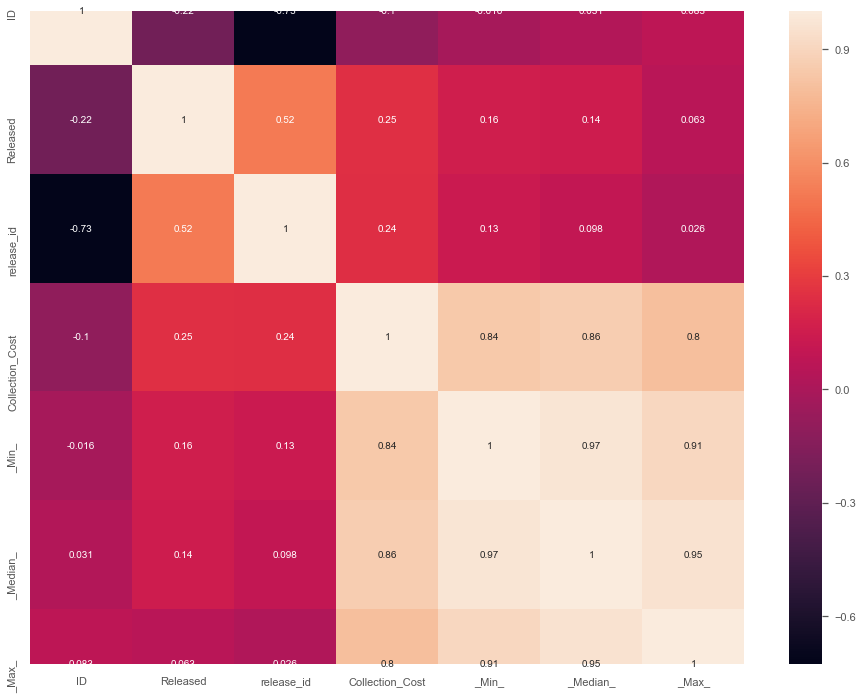

In [118]:
corrMatrix = discogs_df.corr()
sns.heatmap(corrMatrix, annot=True)

## Plot boxplot of the collection cost, minimum sold, median sold, and max sold.

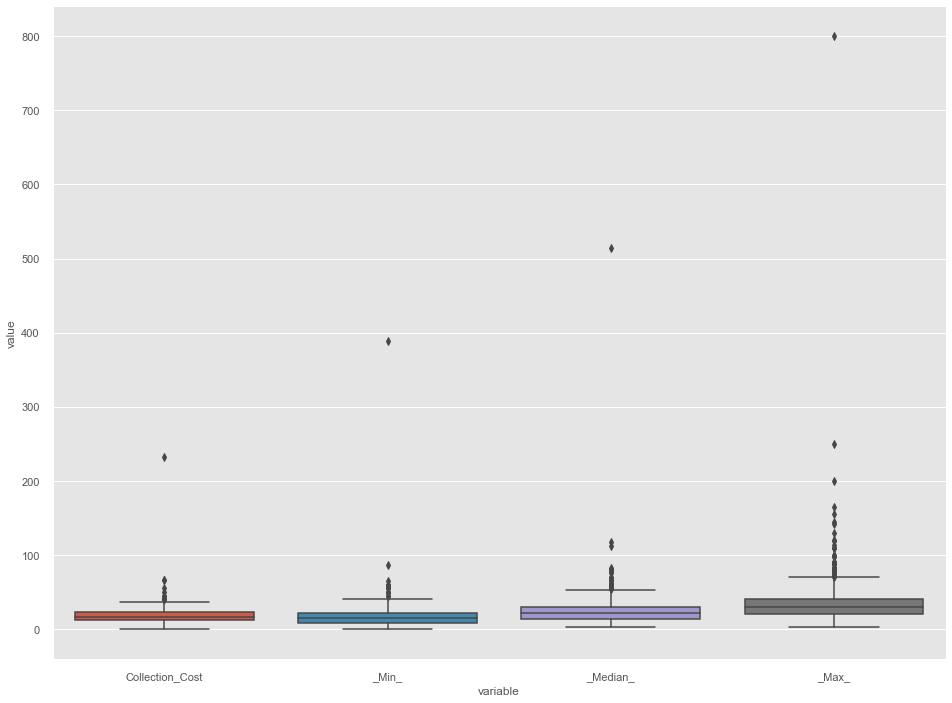

In [119]:
sns.boxplot(x="variable", y="value", data=pd.melt(discogs_df[['Collection_Cost','_Min_','_Median_','_Max_']]))

Remove outlier

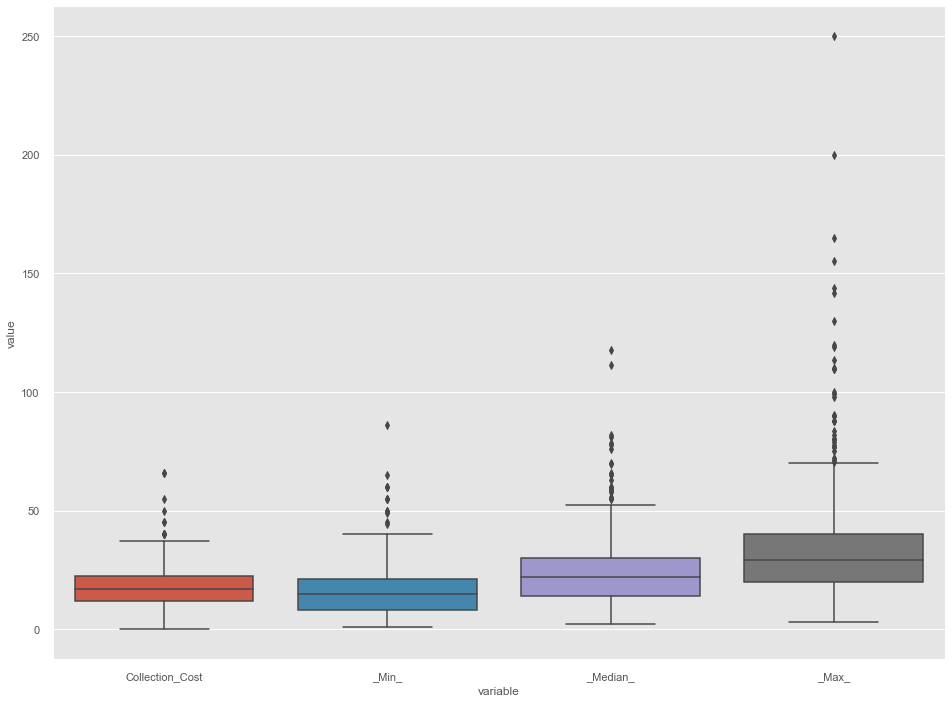

In [120]:
sns.boxplot(x="variable", y="value", data=pd.melt(discogs_df[['Collection_Cost','_Min_','_Median_','_Max_']][discogs_df.Collection_Cost < discogs_df['Collection_Cost'].max()]))

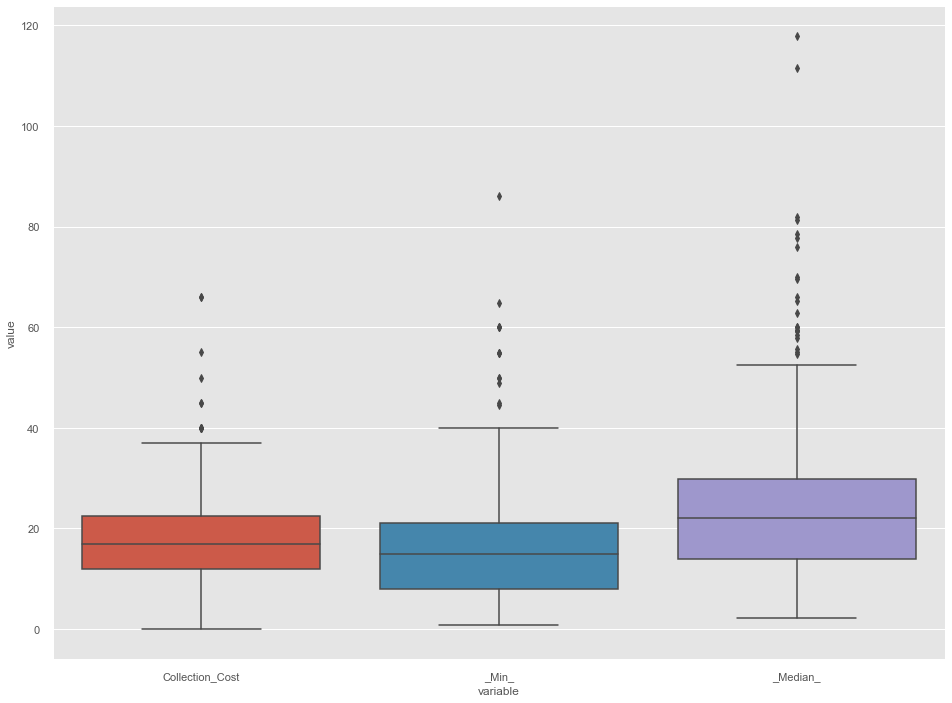

In [121]:
sns.boxplot(x="variable", y="value", data=pd.melt(discogs_df[['Collection_Cost','_Min_','_Median_']][discogs_df.Collection_Cost < discogs_df['Collection_Cost'].max()]))

In [122]:
discogs_df[['Collection_Cost','_Min_','_Median_','_Max_']].sum().reset_index()

,index,0
0,Collection_Cost,7559.68
1,_Min_,6790.40
2,_Median_,10058.45
3,_Max_,14996.18


In [123]:
print('I spent $', discogs_df['Collection_Cost'].sum(),' on music that is recorded on Discogs. \n \nMy collection is worth $',discogs_df['_Median_'].sum())

I spent $ 7559.679999999999  on music that is recorded on Discogs. 
 
My collection is worth $ 10058.45


In [124]:
discogs_df[['Collection_Cost','_Min_','_Median_','_Max_']].mean().reset_index()

,index,0
0,Collection_Cost,18.528627
1,_Min_,17.322449
2,_Median_,25.659311
3,_Max_,38.255561


In [125]:
print('I spent on averege $', discogs_df['Collection_Cost'].mean().round(2),' on per album that is recorded on Discogs. \n \nMy average collection is worth $',discogs_df['_Median_'].mean().round(2))

I spent on averege $ 18.53  on per album that is recorded on Discogs. 
 
My average collection is worth $ 25.66


## What is the most expensive record I bought?

In [126]:
max_cost = discogs_df[discogs_df['Collection_Cost']==discogs_df['Collection_Cost'].max()]
max_cost

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Released,release_id,CollectionFolder,Date_Added,Collection_Cost,Collection_Autographed,_Min_,_Median_,_Max_,Genre,Subgenre,Label1,Label2,Label3,Label4,Record
302,187,"NB 3446-5, 3446-5",Meshuggah,Meshuggah,25 Years Of Musical Deviance,"Nuclear Blast, Nuclear Blast","Box, Comp, Ltd + 12"", EP, RE, Cle + 2xLP, Albu...",2016,8808750.0,Vinyl,07/2016,232.0,No,389.0,514.17,799.99,Metal,Djent,Nuclear Blast,Nuclear Blast,None,None,Meshuggah - 25 Years Of Musical Deviance


In [127]:
max_cost[['Artist','Title','Format','Collection_Cost','_Median_','Genre','Subgenre']]

,Artist,Title,Format,Collection_Cost,_Median_,Genre,Subgenre
302,Meshuggah,25 Years Of Musical Deviance,"Box, Comp, Ltd + 12"", EP, RE, Cle + 2xLP, Albu...",232.0,514.17,Metal,Djent


In [128]:
print('This record has 7 full length albums and 3 EPs plus a DVD and a lyric book')

This record has 7 full length albums and 3 EPs plus a DVD and a lyric book


The most expensive record I own is the Meshuggah - 25 Years Of Musical Deviance, Boxset.

## What is the least expensive record I own?

In [129]:
min_cost = discogs_df[discogs_df['Collection_Cost']==discogs_df['Collection_Cost'].min()]
min_cost

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Released,release_id,CollectionFolder,Date_Added,Collection_Cost,Collection_Autographed,_Min_,_Median_,_Max_,Genre,Subgenre,Label1,Label2,Label3,Label4,Record
87,189,Relic 009,Bunrage / Footpaths,Bunrage / Footpaths,Untitled,Haute Magie,"LP, Cle",2012,3469073.0,Vinyl,06/2016,0.0,No,NaN,NaN,NaN,Folk,Folk,Haute Magie,None,None,None,Bunrage / Footpaths - Untitled


In [130]:
min_cost[['Artist','Title','Format','Collection_Cost','_Median_','Genre','Subgenre']]

,Artist,Title,Format,Collection_Cost,_Median_,Genre,Subgenre
87,Bunrage / Footpaths,Untitled,"LP, Cle",0.0,NaN,Folk,Folk


In [131]:
print('I got this record for free from a friend')

I got this record for free from a friend


## What is the least expensive record I bought?

In [132]:
purchased_df = discogs_df[discogs_df.Collection_Cost > 0]
min_purchase = purchased_df[purchased_df['Collection_Cost']==purchased_df['Collection_Cost'].min()]
min_purchase[['Artist','Title','Format','Collection_Cost','_Median_','Genre','Subgenre']]

,Artist,Title,Format,Collection_Cost,_Median_,Genre,Subgenre
13,Whitesnake,Whitesnake,"LP, Album",0.5,9.05,Rock,Classic Rock
17,Wyclef Jean,The Preacher's Son,"2xLP, Promo",0.5,3.88,Hip Hop,Hip Hop


I bought Wyclef Jean 2xLP at the basement of Dusty Groove for 50 cents.

## What are the top 10 records I spent the most?

In [133]:
discogs_df[['CollectionFolder','Record','Genre','Subgenre',
            'Collection_Autographed','Collection_Cost',
            '_Min_','_Median_','_Max_']].sort_values('Collection_Cost',ascending = False).head(10)

,CollectionFolder,Record,Genre,Subgenre,Collection_Autographed,Collection_Cost,_Min_,_Median_,_Max_
302,Vinyl,Meshuggah - 25 Years Of Musical Deviance,Metal,Djent,No,232.0,389.00,514.17,799.99
54,Vinyl,Opeth - In Live Concert At The Royal Albert Hall,Metal,Progressive Metal,No,66.0,85.99,117.83,141.76
394,Vinyl,Cult Of Luna - A Dawn To Fear,Metal,Post Metal,No,66.0,27.47,54.74,58.23
201,Vinyl,Mastodon - Remission,Metal,Sludge Metal,No,55.0,45.00,81.97,143.90
254,Vinyl,Opeth - Book Of Opeth,Metal,Progressive Metal,No,50.0,6.57,59.28,97.80
288,Vinyl,Cult Of Luna - Salvation,Metal,Post Metal,No,45.0,24.00,51.12,56.18
294,Vinyl,Cult Of Luna - Somewhere Along The Highway,Metal,Post Metal,No,45.0,28.00,59.20,79.99
303,Vinyl,Sioum - Yet Further,Metal,Progressive Metal,No,40.0,NaN,NaN,NaN
122,Vinyl,Opeth - Ghost Reveries,Metal,Progressive Metal,No,40.0,20.00,24.98,32.18
202,Vinyl,Leprous - Bilateral,Metal,Progressive Metal,Yes,40.0,50.00,111.52,155.02


In [134]:
discogs_df[['CollectionFolder','Record','Genre','Subgenre',
            'Collection_Autographed','Collection_Cost',
            '_Min_','_Median_','_Max_']].sort_values('Collection_Cost',ascending = False).groupby('CollectionFolder').head(10)

,CollectionFolder,Record,Genre,Subgenre,Collection_Autographed,Collection_Cost,_Min_,_Median_,_Max_
302,Vinyl,Meshuggah - 25 Years Of Musical Deviance,Metal,Djent,No,232.0,389.00,514.17,799.99
54,Vinyl,Opeth - In Live Concert At The Royal Albert Hall,Metal,Progressive Metal,No,66.0,85.99,117.83,141.76
394,Vinyl,Cult Of Luna - A Dawn To Fear,Metal,Post Metal,No,66.0,27.47,54.74,58.23
201,Vinyl,Mastodon - Remission,Metal,Sludge Metal,No,55.0,45.00,81.97,143.90
254,Vinyl,Opeth - Book Of Opeth,Metal,Progressive Metal,No,50.0,6.57,59.28,97.80
288,Vinyl,Cult Of Luna - Salvation,Metal,Post Metal,No,45.0,24.00,51.12,56.18
294,Vinyl,Cult Of Luna - Somewhere Along The Highway,Metal,Post Metal,No,45.0,28.00,59.20,79.99
303,Vinyl,Sioum - Yet Further,Metal,Progressive Metal,No,40.0,NaN,NaN,NaN
122,Vinyl,Opeth - Ghost Reveries,Metal,Progressive Metal,No,40.0,20.00,24.98,32.18
202,Vinyl,Leprous - Bilateral,Metal,Progressive Metal,Yes,40.0,50.00,111.52,155.02


## What are the top 10 bands with the most expensive records purchased?

In [135]:
record_sum   = discogs_df.groupby(['Artist2']).agg({
                       'Title': 'count',
                       'Label': 'nunique',
                       'Collection_Cost': 'sum',
                       '_Min_': 'sum',
                       '_Median_': 'sum',
                       '_Max_': 'sum'
                        }).reset_index().sort_values(by='_Median_',ascending=False)

## Plot top 10 bands that I purchased the most by cost

,Artist2,Title,Label,Collection_Cost,_Min_,_Median_,_Max_
35,Cult Of Luna,16,7,552.75,390.58,576.84,795.90
105,Opeth,19,13,533.00,419.55,660.02,1013.97
88,Meshuggah,2,1,260.00,403.00,546.67,839.98
111,Panopticon (6),11,4,238.25,205.87,285.85,406.34
73,Isis (6),12,4,217.00,214.61,317.39,492.03
38,Deathspell Omega,9,3,190.00,152.34,215.67,355.69
87,Mastodon,9,5,177.00,124.95,236.89,409.37
15,Between The Buried And Me,10,2,157.50,234.89,333.08,544.67
155,Thou (2),9,9,137.00,123.96,180.03,246.03
112,Perturbator,5,2,130.00,116.89,178.00,261.04


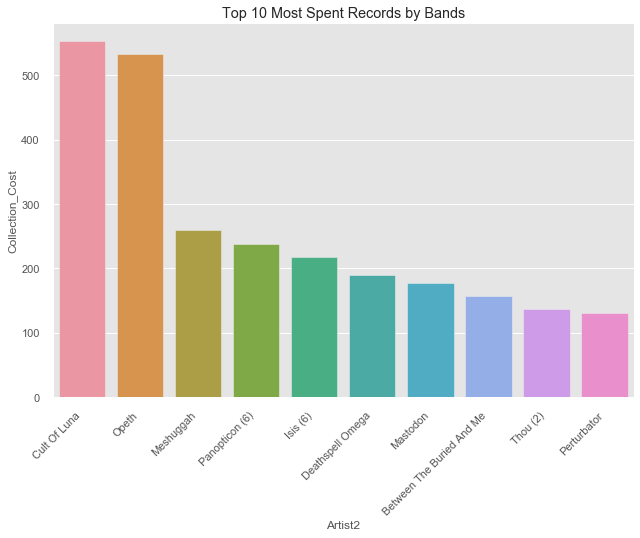

In [136]:
chart = sns.catplot(x="Artist2", y="Collection_Cost", kind="bar", 
                    data=record_sum.sort_values('Collection_Cost',ascending=False).head(10),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')
plt.title('Top 10 Most Spent Records by Bands')

record_sum.sort_values('Collection_Cost',ascending=False).head(10)

## What the most records purchased by the Top 10 bands?

,Artist2,Title,Label,Collection_Cost,_Min_,_Median_,_Max_
105,Opeth,19,13,533.00,419.55,660.02,1013.97
35,Cult Of Luna,16,7,552.75,390.58,576.84,795.90
73,Isis (6),12,4,217.00,214.61,317.39,492.03
111,Panopticon (6),11,4,238.25,205.87,285.85,406.34
15,Between The Buried And Me,10,2,157.50,234.89,333.08,544.67
87,Mastodon,9,5,177.00,124.95,236.89,409.37
38,Deathspell Omega,9,3,190.00,152.34,215.67,355.69
155,Thou (2),9,9,137.00,123.96,180.03,246.03
80,Krallice,6,2,126.00,93.87,135.20,143.58
186,Yes,6,1,28.00,21.82,46.15,105.74


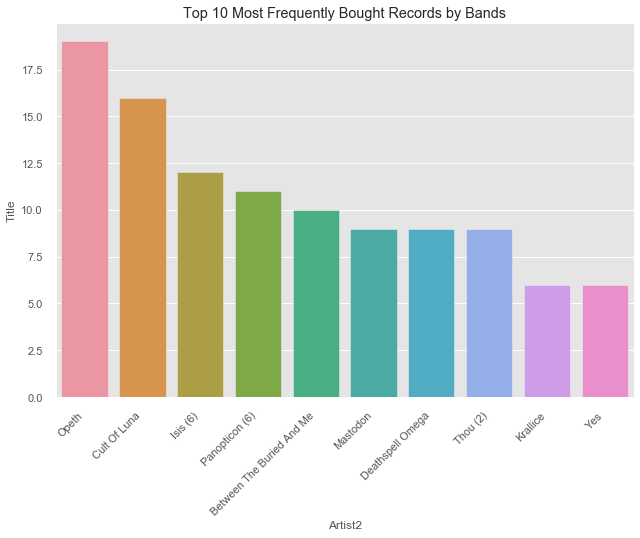

In [137]:
chart = sns.catplot(x="Artist2", y="Title", kind="bar", 
                    data=record_sum.sort_values('Title',ascending=False).head(10),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')
plt.title('Top 10 Most Frequently Bought Records by Bands')

record_sum.sort_values('Title',ascending=False).head(10)

## What are the top 10 most valuable record by min?

,Record,Collection_Cost,_Min_,_Median_,_Max_
302,Meshuggah - 25 Years Of Musical Deviance,232.0,389.00,514.17,799.99
54,Opeth - In Live Concert At The Royal Albert Hall,66.0,85.99,117.83,141.76
142,Haken (2) - The Mountain,22.0,64.84,81.20,109.88
86,Between The Buried And Me - The Parallax II: F...,30.0,60.00,70.00,113.64
341,Yellow Eyes (2) - Immersion Trench Reverie,15.0,60.00,69.50,79.00
340,Isis (6) - Live VII - 02.25.10,18.0,60.00,65.96,90.00
141,Opeth - Heritage,40.0,54.95,75.92,100.00
140,Between The Buried And Me - The Anatomy Of,21.0,54.95,78.50,165.00
139,Leprous - Coal,20.0,54.93,59.44,87.91
202,Leprous - Bilateral,40.0,50.00,111.52,155.02


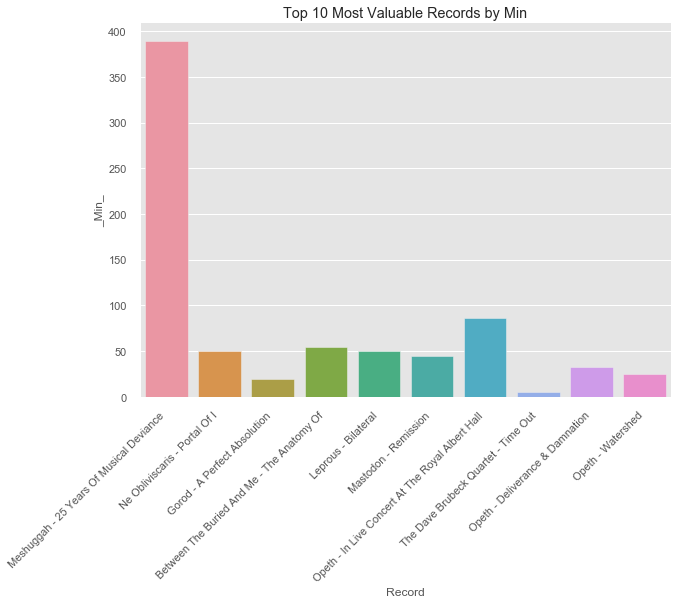

In [138]:
chart = sns.catplot(x="Record", y="_Min_", kind="bar", 
                    data=discogs_df.sort_values('_Max_',ascending=False).head(10),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')
plt.title('Top 10 Most Valuable Records by Min')

discogs_df[['Record','Collection_Cost',
            '_Min_','_Median_','_Max_']].sort_values('_Min_',ascending=False).head(10)

## What are the top 10 most valuable record by median?

,Record,Title,Subgenre,Collection_Cost,_Min_,_Median_,_Max_
302,Meshuggah - 25 Years Of Musical Deviance,25 Years Of Musical Deviance,Djent,232.0,389.00,514.17,799.99
54,Opeth - In Live Concert At The Royal Albert Hall,In Live Concert At The Royal Albert Hall,Progressive Metal,66.0,85.99,117.83,141.76
202,Leprous - Bilateral,Bilateral,Progressive Metal,40.0,50.00,111.52,155.02
201,Mastodon - Remission,Remission,Sludge Metal,55.0,45.00,81.97,143.90
142,Haken (2) - The Mountain,The Mountain,Progressive Metal,22.0,64.84,81.20,109.88
140,Between The Buried And Me - The Anatomy Of,The Anatomy Of,Progressive Metal,21.0,54.95,78.50,165.00
203,Ne Obliviscaris - Portal Of I,Portal Of I,Progressive Metal,30.0,50.00,77.81,250.00
141,Opeth - Heritage,Heritage,Progressive Metal,40.0,54.95,75.92,100.00
86,Between The Buried And Me - The Parallax II: F...,The Parallax II: Future Sequence,Progressive Metal,30.0,60.00,70.00,113.64
341,Yellow Eyes (2) - Immersion Trench Reverie,Immersion Trench Reverie,Black Metal,15.0,60.00,69.50,79.00


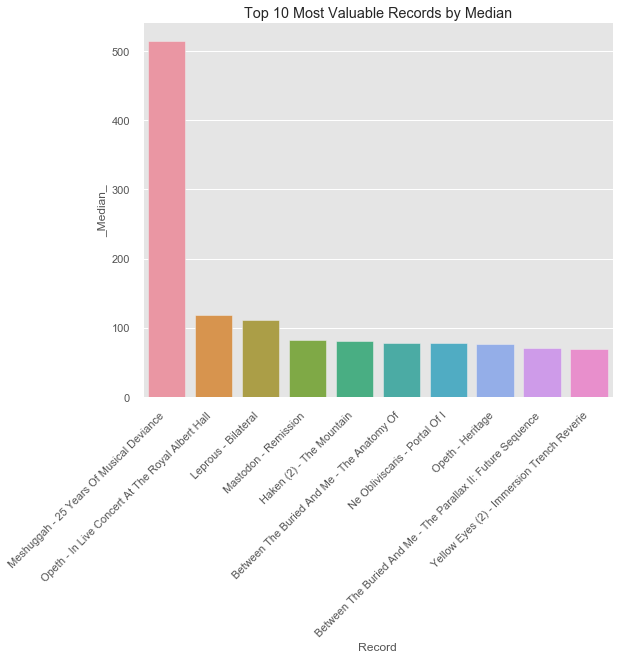

In [139]:
chart = sns.catplot(x="Record", y="_Median_", kind="bar", 
                    data=discogs_df.sort_values('_Median_',ascending=False).head(10),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')
plt.title('Top 10 Most Valuable Records by Median')

discogs_df[['Record','Title','Subgenre','Collection_Cost',
            '_Min_','_Median_','_Max_']].sort_values('_Median_',ascending=False).head(10)

## What are the top 10 most valuable record by max?

,Record,Collection_Cost,_Min_,_Median_,_Max_
302,Meshuggah - 25 Years Of Musical Deviance,232.0,389.00,514.17,799.99
203,Ne Obliviscaris - Portal Of I,30.0,50.00,77.81,250.00
81,Gorod - A Perfect Absolution,12.0,19.99,48.05,199.98
140,Between The Buried And Me - The Anatomy Of,21.0,54.95,78.50,165.00
202,Leprous - Bilateral,40.0,50.00,111.52,155.02
201,Mastodon - Remission,55.0,45.00,81.97,143.90
54,Opeth - In Live Concert At The Royal Albert Hall,66.0,85.99,117.83,141.76
2,The Dave Brubeck Quartet - Time Out,20.0,5.07,26.50,130.00
248,Opeth - Deliverance & Damnation,36.0,33.03,58.44,119.99
194,Opeth - Watershed,30.0,25.00,55.00,119.00


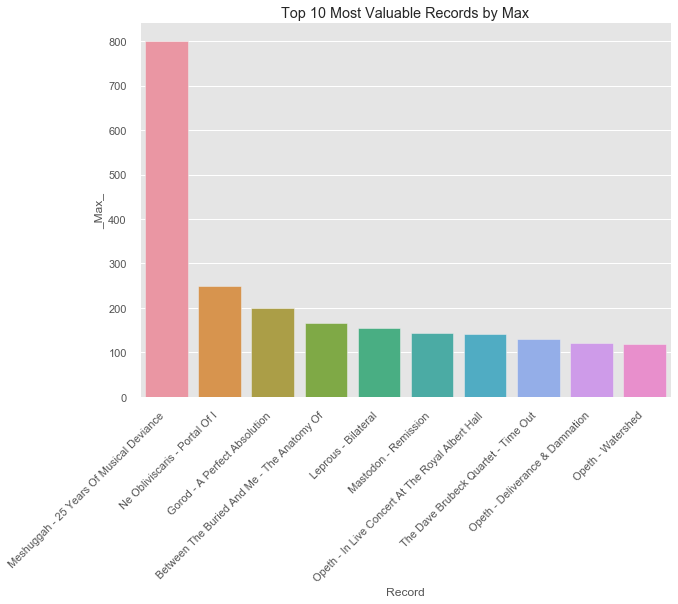

In [140]:
chart = sns.catplot(x="Record", y="_Max_", kind="bar", 
                    data=discogs_df.sort_values('_Max_',ascending=False).head(10),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')
plt.title('Top 10 Most Valuable Records by Max')

discogs_df[['Record','Collection_Cost',
            '_Min_','_Median_','_Max_']].sort_values('_Max_',ascending=False).head(10)

The Meshuggah boxset was sold for 514.17 and I bought it for 232.

## What are the Top 10 albums sold by average?

In [141]:
record_mean   = discogs_df.groupby(['Artist2']).agg({
                       'Title': 'count',
                       'Label': 'nunique',
                       'Collection_Cost': 'mean',
                       '_Min_': 'mean',
                       '_Median_': 'mean',
                       '_Max_': 'mean'
                        }).reset_index().sort_values(by='_Median_',ascending=False)

,Artist2,Title,Label,Collection_Cost,_Min_,_Median_,_Max_
88,Meshuggah,2,1,130.000000,201.500000,273.335000,419.990000
83,Leprous,3,2,28.000000,42.586667,67.493333,95.106667
96,Ne Obliviscaris,2,2,25.000000,37.000000,54.520000,144.230000
150,The Contortionist (2),4,3,20.625000,30.247500,54.057500,68.232500
3,Altar Of Plagues,1,1,36.500000,40.000000,49.990000,82.050000
56,Gojira (2),1,1,30.000000,33.000000,48.490000,65.000000
185,Yellow Eyes (2),2,1,16.500000,41.995000,47.075000,52.495000
31,Cloudkicker,1,1,15.000000,30.000000,46.980000,55.000000
171,Vildhjarta,2,2,17.500000,25.495000,46.385000,59.990000
12,Baroness,3,2,17.543333,29.680000,45.973333,66.583333


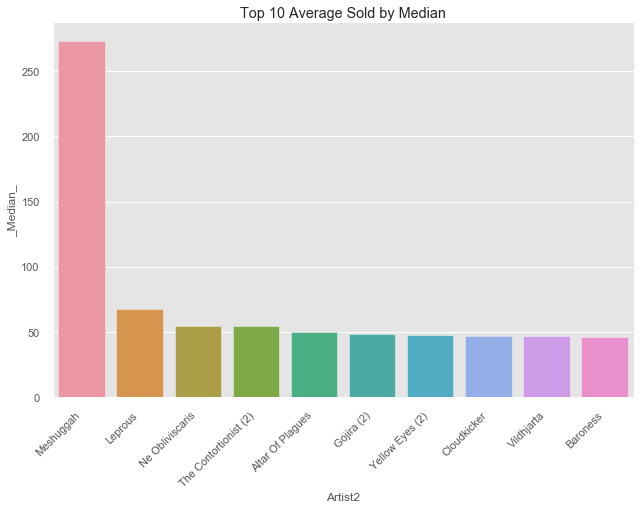

In [142]:
chart = sns.catplot(x="Artist2", y="_Median_", kind="bar", 
                    data=record_mean.sort_values('_Median_',ascending=False).head(10),
                    height=6, aspect=1.5)
plt.title('Top 10 Average Sold by Median')
chart.set_xticklabels(rotation=45, horizontalalignment='right')
record_mean.sort_values('_Median_',ascending=False).head(10)

## What are the Top 10 albums sold by max?

,Artist2,Title,Label,Collection_Cost,_Min_,_Median_,_Max_
88,Meshuggah,2,1,130.000,201.500000,273.335000,419.990000
96,Ne Obliviscaris,2,2,25.000,37.000000,54.520000,144.230000
151,The Dave Brubeck Quartet,1,1,20.000,5.070000,26.500000,130.000000
58,Gorod,2,1,14.000,15.995000,35.275000,114.990000
83,Leprous,3,2,28.000,42.586667,67.493333,95.106667
3,Altar Of Plagues,1,1,36.500,40.000000,49.990000,82.050000
1,Agalloch,1,1,30.000,16.000000,35.000000,70.650000
41,Devourment,1,1,13.630,20.000000,31.000000,69.990000
23,Carpenter Brut,1,1,36.000,32.610000,35.850000,69.980000
150,The Contortionist (2),4,3,20.625,30.247500,54.057500,68.232500


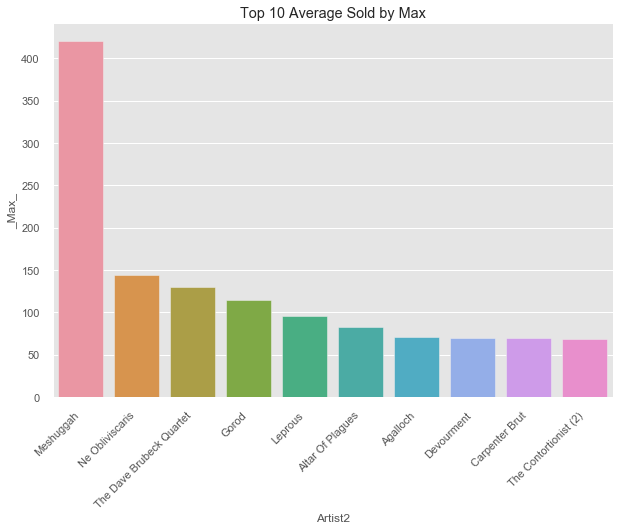

In [143]:
chart = sns.catplot(x="Artist2", y="_Max_", kind="bar", 
                    data=record_mean.sort_values('_Max_',ascending=False).head(10),
                    height=6, aspect=1.5)
plt.title('Top 10 Average Sold by Max')
chart.set_xticklabels(rotation=45, horizontalalignment='right')
record_mean.sort_values('_Max_',ascending=False).head(10)

### Opeth Analysis

In [144]:
discogs_df[['Artist2','Title','Collection_Cost','_Min_','_Median_','_Max_']][discogs_df.Artist2 == 'Opeth'].sort_values('_Max_',ascending=False)

,Artist2,Title,Collection_Cost,_Min_,_Median_,_Max_
54,Opeth,In Live Concert At The Royal Albert Hall,66.0,85.99,117.83,141.76
248,Opeth,Deliverance & Damnation,36.0,33.03,58.44,119.99
194,Opeth,Watershed,30.0,25.00,55.00,119.00
141,Opeth,Heritage,40.0,54.95,75.92,100.00
254,Opeth,Book Of Opeth,50.0,6.57,59.28,97.80
131,Opeth,Morningrise,6.0,26.00,35.00,65.21
32,Opeth,Orchid,22.0,19.47,32.61,43.48
238,Opeth,The Roundhouse Tapes,30.0,20.00,26.26,42.50
33,Opeth,"My Arms, Your Hearse",6.0,20.00,33.33,41.11
273,Opeth,Lamentations Live At Shepherd's Bush Empire,30.0,15.05,28.05,39.98


# Label Analysis

In [145]:
label_sum   = discogs_df.groupby(['Label']).agg({
                       'Artist2': 'nunique',
                       'Title': 'count',
                       'Collection_Cost': 'sum',
                       '_Min_': 'sum',
                       '_Median_': 'sum',
                       '_Max_': 'sum'
                        }).reset_index().sort_values(by='_Median_',ascending=False)
label_sum.head()

,Label,Artist2,Title,Collection_Cost,_Min_,_Median_,_Max_
113,Relapse Records,13,23,451.27,374.98,591.73,943.35
104,"Nuclear Blast, Nuclear Blast",3,4,289.50,427.74,579.53,885.80
23,Century Media,10,17,346.00,275.26,458.06,650.54
17,Blood Music (2),5,9,260.00,268.74,429.77,748.10
109,Prosthetic Records,6,13,221.00,164.36,271.41,391.61


## Which record labels did I spend the most?

,Label,Artist2,Title,Collection_Cost,_Min_,_Median_,_Max_
113,Relapse Records,13,23,451.27,374.98,591.73,943.35
23,Century Media,10,17,346.00,275.26,458.06,650.54
104,"Nuclear Blast, Nuclear Blast",3,4,289.50,427.74,579.53,885.80
17,Blood Music (2),5,9,260.00,268.74,429.77,748.10
41,Earache,4,9,230.74,160.17,260.32,319.41
109,Prosthetic Records,6,13,221.00,164.36,271.41,391.61
66,Indie Recordings,1,5,175.00,124.12,170.59,269.45
52,Gilead Media,4,9,172.50,200.85,260.41,300.35
1,20 Buck Spin,8,10,169.00,134.06,200.41,267.73
91,"Nordvis Produktion, Bindrune Recordings",3,7,164.00,170.63,214.93,296.49


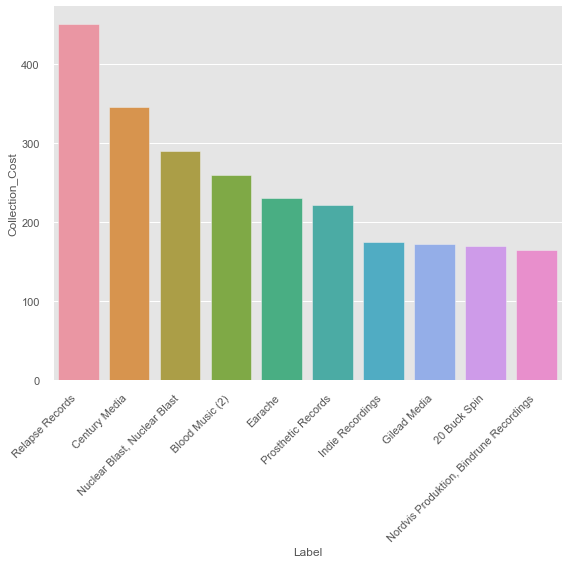

In [146]:
chart = sns.catplot(x="Label", y="Collection_Cost", kind="bar", 
                    data=label_sum.sort_values('Collection_Cost',ascending=False).head(10),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')
label_sum.sort_values('Collection_Cost',ascending=False).head(10)

In [147]:
discogs_df.columns

Index(['ID', 'Catalog#', 'Artist', 'Artist2', 'Title', 'Label', 'Format',
       'Released', 'release_id', 'CollectionFolder', 'Date_Added',
       'Collection_Cost', 'Collection_Autographed', '_Min_', '_Median_',
       '_Max_', 'Genre', 'Subgenre', 'Label1', 'Label2', 'Label3', 'Label4',
       'Record'],
      dtype='object')

In [148]:
discogs_df.Date_Added = pd.to_datetime(discogs_df.Date_Added).dt.strftime('%m/%Y')
discogs_df.Date_Added.head()

0    07/2019
1    12/2016
2    05/2014
3    04/2017
4    02/2020
Name: Date_Added, dtype: object

# Time Series

### Group data by `Released` and `Date_Added` then get sum by `Collection_Cost`, `_Min_`, `_Median_`, and `_Max_`.

In [149]:
time_df  = discogs_df.groupby(['Released','Date_Added']).agg({
                               'Collection_Cost': 'sum',
                               'Artist': 'nunique',
                               'Artist2': 'nunique',
                               'Title': 'count',
                               '_Min_': 'sum',
                               '_Median_': 'sum',
                               '_Max_': 'sum'
                                }).reset_index().sort_values(by='Date_Added',ascending=True)
time_df.head()

,Released,Date_Added,Collection_Cost,Artist,Artist2,Title,_Min_,_Median_,_Max_
60,2012,01/2014,12.00,1,1,1,4.66,12.05,19.69
73,2013,01/2014,68.00,4,4,5,106.05,161.86,223.85
48,2011,01/2014,8.00,1,1,1,8.86,11.09,15.38
92,2014,01/2015,52.00,2,2,2,28.50,72.73,95.91
127,2016,01/2016,20.72,1,1,1,16.56,23.66,33.00


Plot `Date_Added` over `Collection_Cost`

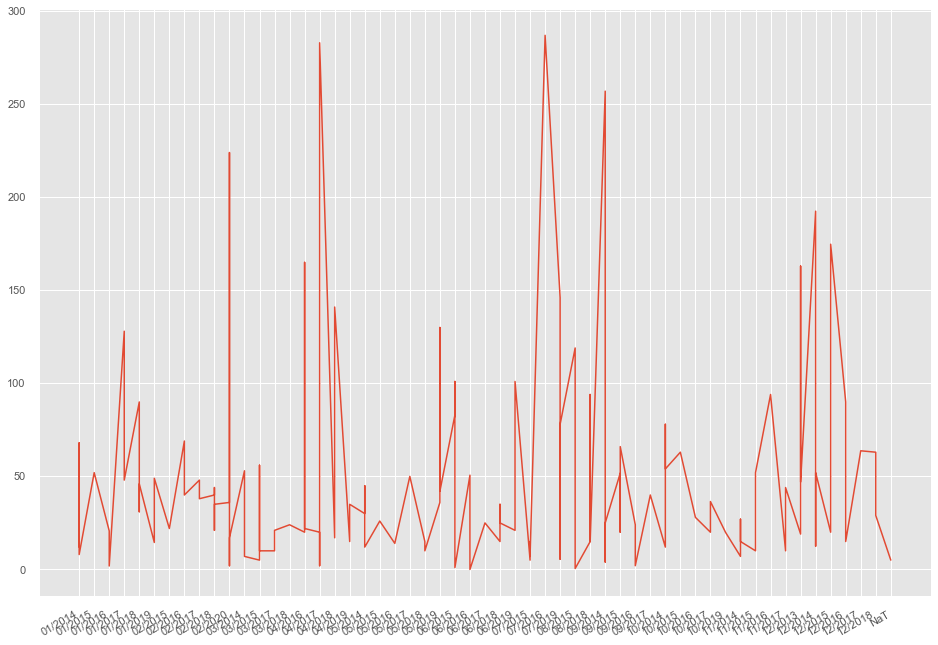

In [150]:
plt.plot(time_df['Date_Added'], time_df['Collection_Cost'])
plt.gcf().autofmt_xdate()
plt.show()

Plot `Date_Added` over `Title`

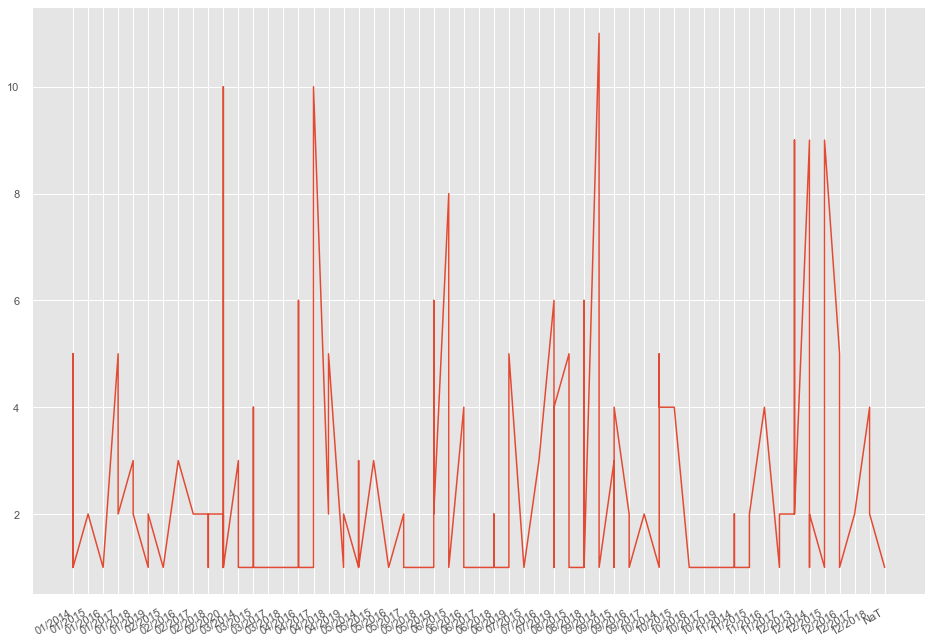

In [151]:
plt.plot(time_df['Date_Added'], time_df['Title'])
plt.gcf().autofmt_xdate()
plt.show()

Plot `Date_Added` over `Artist2`

There were some days that I logged many records at once on discogs.

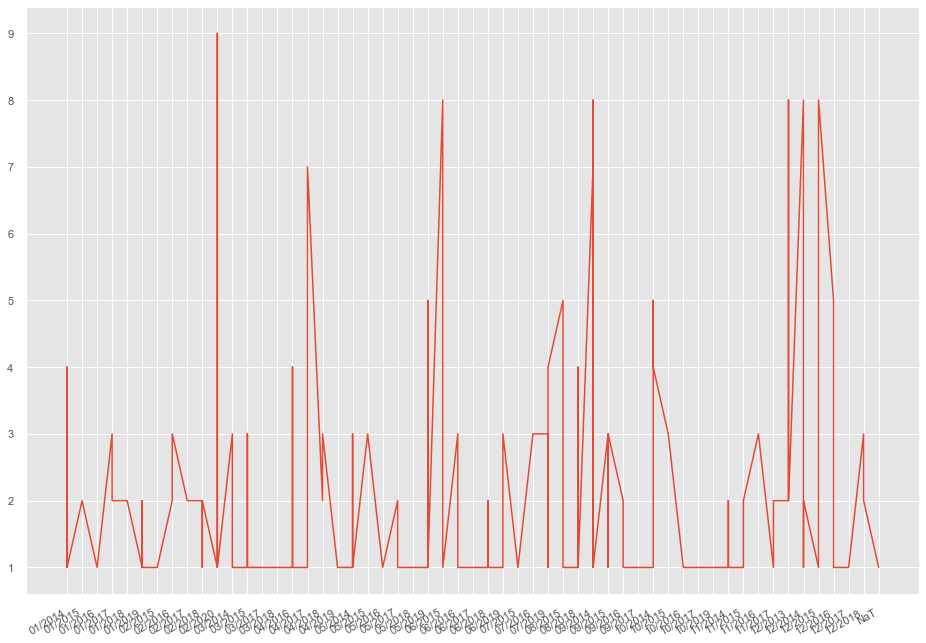

In [152]:
plt.plot(time_df['Date_Added'], time_df['Artist2'])
plt.gcf().autofmt_xdate()
plt.show()

### Group data by `Released`

In [153]:
year_df  = discogs_df.groupby(['Released']).agg({
                               'Artist2': 'count',
                               'Title': 'count',
                               'CollectionFolder':'count',
                               'Genre':'count', 
                               'Subgenre':'count',
                               'Collection_Cost': 'sum',
                               '_Min_': 'sum',
                               '_Median_': 'sum',
                               '_Max_': 'sum'
                                }).reset_index().sort_values(by='Released',ascending=True)
year_df.head()

,Released,Artist2,Title,CollectionFolder,Genre,Subgenre,Collection_Cost,_Min_,_Median_,_Max_
0,1961,1,1,1,1,1,20.0,5.07,26.50,130.00
1,1971,1,1,1,1,1,5.5,2.25,3.87,10.00
2,1973,2,2,2,2,2,10.5,11.94,23.48,40.00
3,1974,1,1,1,1,1,4.0,1.13,7.00,30.74
4,1975,1,1,1,1,1,12.0,10.00,17.00,25.00


In [154]:
year_df['Released'].describe()

count      32.0000
mean     1998.2500
std        17.5683
min      1961.0000
25%      1979.7500
50%      2004.5000
75%      2012.2500
max      2020.0000
Name: Released, dtype: float64

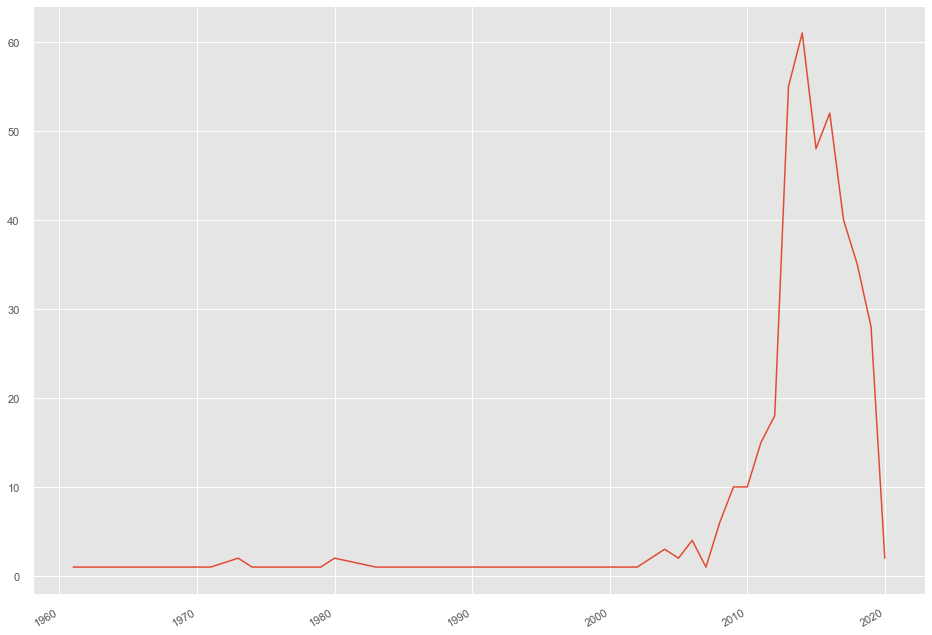

In [155]:
plt.plot(year_df['Released'], year_df['Artist2'])
plt.gcf().autofmt_xdate()
plt.show()

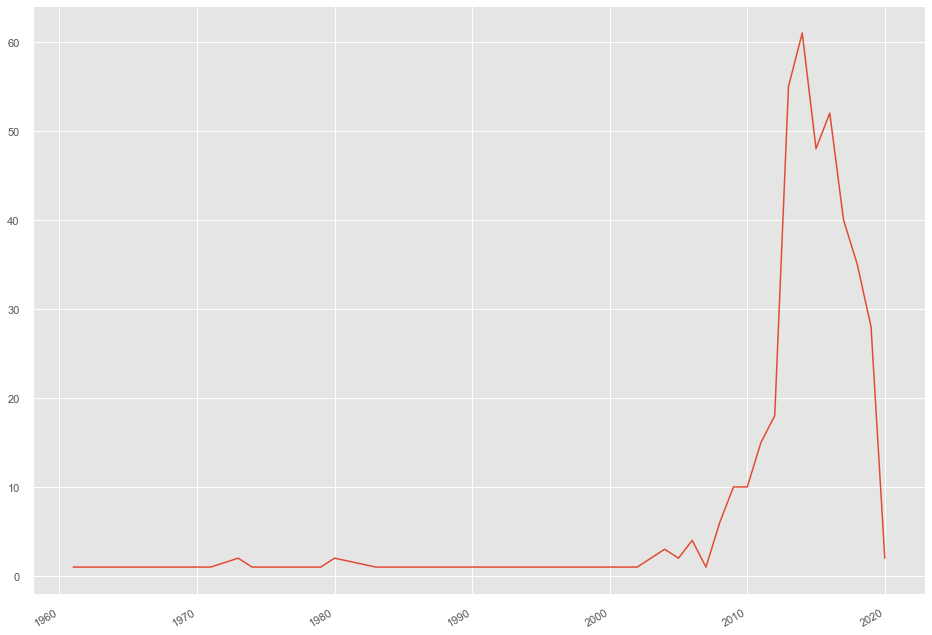

In [156]:
plt.plot(year_df['Released'], year_df['Title'])
plt.gcf().autofmt_xdate()
plt.show()

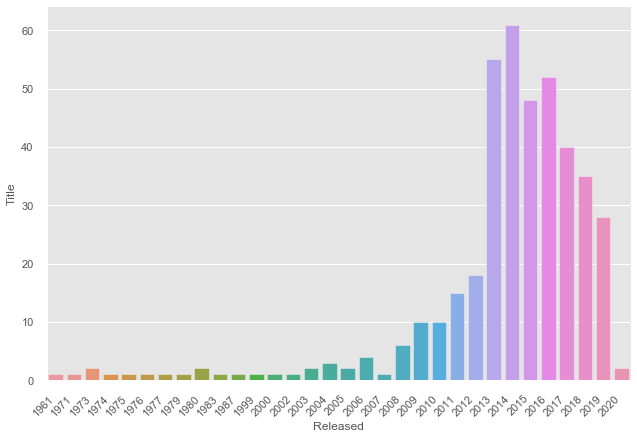

In [157]:
chart = sns.catplot(x="Released", y="Title", kind="bar", 
                    data=year_df.sort_values('Released',ascending=True),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')

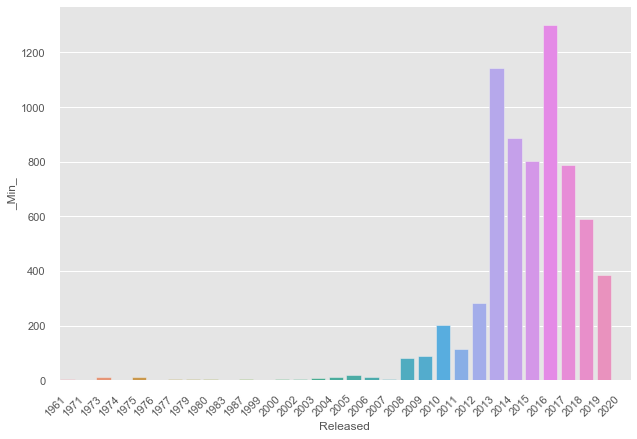

In [158]:
chart = sns.catplot(x="Released", y="_Min_", kind="bar", 
                    data=year_df.sort_values('Released',ascending=True),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')

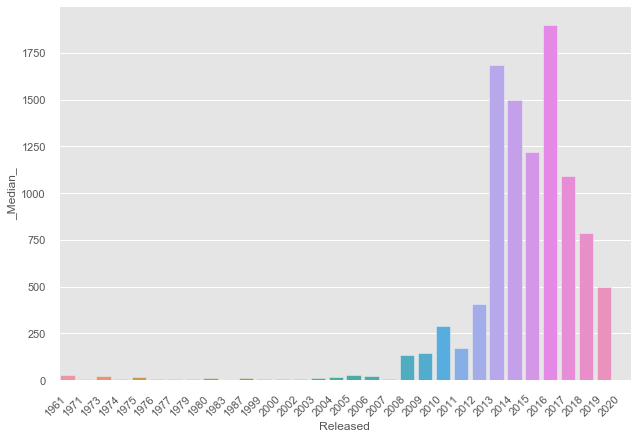

In [159]:
chart = sns.catplot(x="Released", y="_Median_", kind="bar", 
                    data=year_df.sort_values('Released',ascending=True),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')

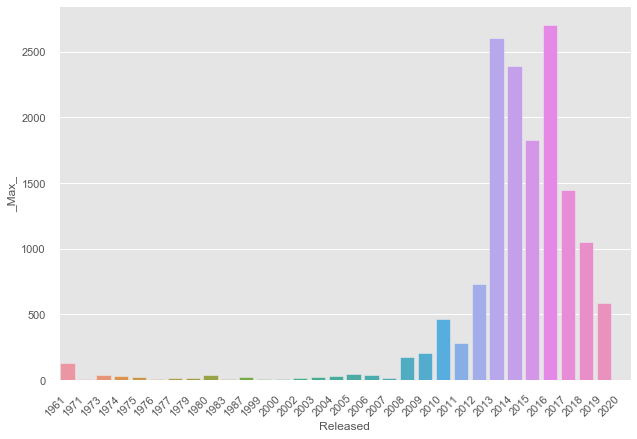

In [160]:
chart = sns.catplot(x="Released", y="_Max_", kind="bar", 
                    data=year_df.sort_values('Released',ascending=True),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')

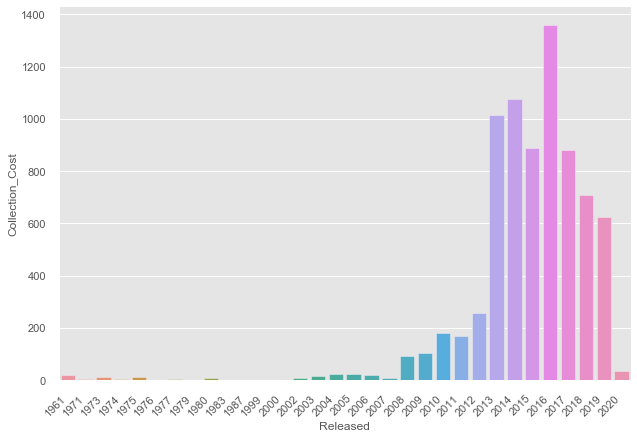

In [161]:
chart = sns.catplot(x="Released", y="Collection_Cost", kind="bar", 
                    data=year_df.sort_values('Released',ascending=True),
                    height=6, aspect=1.5)
chart.set_xticklabels(rotation=45, horizontalalignment='right')

In [162]:
# https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
# bins = np.arange(0, 65, 5)
# g = sns.FacetGrid(discogs_df, col="Format",  row="Collection_Autographed")
# g = g.map(plt.hist, "Collection_Cost", bins=bins, color="r")

In [163]:
# tips = sns.load_dataset("tips")
# g = sns.FacetGrid(tips, col="time",  row="smoker")
# g = g.map(plt.hist, "total_bill")

# Genre and Subgenre analysis

In [164]:
discogs_df.Genre.value_counts()

Metal         358
Rock           31
Electronic     12
Pop             3
Hip Hop         2
Folk            1
Jazz            1
Name: Genre, dtype: int64

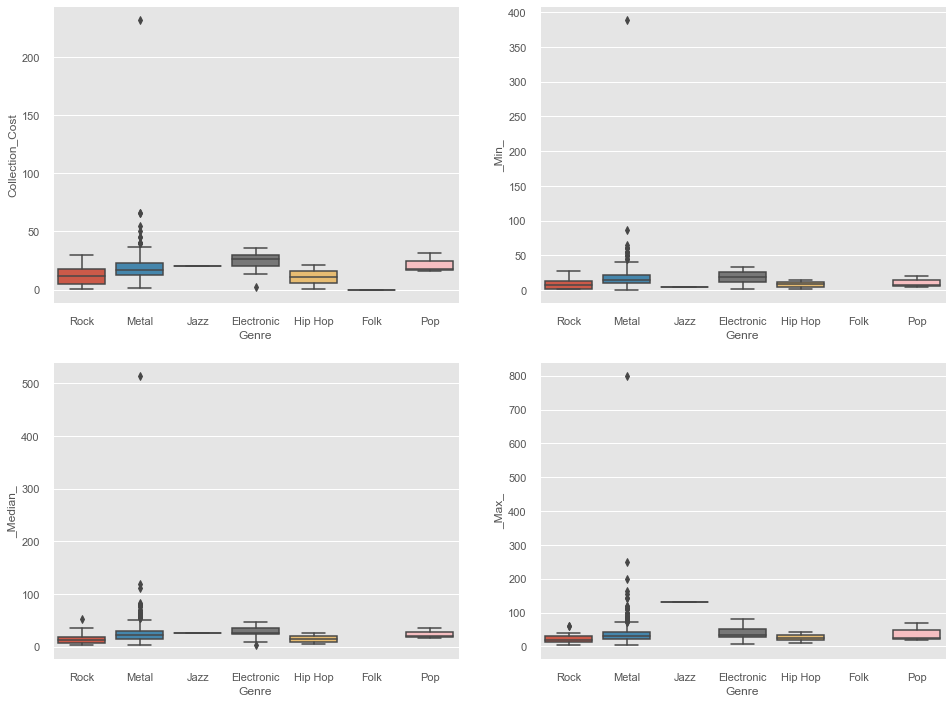

In [165]:
fig, axes = plt.subplots(2, 2)

ax = sns.boxplot(x="Genre", y="Collection_Cost", data=discogs_df, orient='v', 
    ax=axes[0, 0])
ax = sns.boxplot(x="Genre", y="_Min_", data=discogs_df, orient='v', 
    ax=axes[0, 1])
ax = sns.boxplot(x="Genre", y="_Median_", data=discogs_df, orient='v', 
    ax=axes[1, 0])
ax = sns.boxplot(x="Genre", y="_Max_", data=discogs_df, orient='v', 
    ax=axes[1, 1])

Remove records less than 2

In [166]:
genre_reduced = discogs_df['Genre'].value_counts()[lambda x: x>2].index.tolist()
genre_reduced

['Metal', 'Rock', 'Electronic', 'Pop']

In [167]:
genre_reduced_df = discogs_df[(discogs_df['Genre'].isin(genre_reduced)) & (discogs_df.Collection_Cost < 200)]
genre_reduced_df.head()

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Released,release_id,CollectionFolder,Date_Added,Collection_Cost,Collection_Autographed,_Min_,_Median_,_Max_,Genre,Subgenre,Label1,Label2,Label3,Label4,Record
0,33,SD 8283,Yes,Yes,The Yes Album,Atlantic,"LP, Album, RE, PR;",1971,7116823.0,Vinyl,07/2019,5.5,No,2.25,3.87,10.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - The Yes Album
1,165,RR 6583-1,Mastodon,Mastodon,Remission,Relapse Records,"2x12"", Album, RE, RM, RP",2017,8863478.0,Vinyl,12/2016,15.0,No,7.99,21.67,30.19,Metal,Sludge Metal,Relapse Records,None,None,None,Mastodon - Remission
3,142,SD 3-100,Yes,Yes,Yessongs,Atlantic,"3xLP, Album",1973,8179158.0,Vinyl,04/2017,5.0,No,3.95,9.99,20.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Yessongs
4,18,SD 2-908,Yes,Yes,Tales From Topographic Oceans,Atlantic,"2xLP, Album, Gat",1973,8535940.0,Vinyl,02/2020,5.5,No,7.99,13.49,20.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Tales From Topographic Oceans
5,340,SD 18122,Yes,Yes,Relayer,Atlantic,"LP, Album, Gat",1974,755646.0,Vinyl,09/2014,4.0,No,1.13,7.00,30.74,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Relayer


In [168]:
genre_reduced_df.Genre.value_counts()

Metal         357
Rock           31
Electronic     12
Pop             3
Name: Genre, dtype: int64

## Boxplot Genre by Collection_Cost, Min, Median, and Max

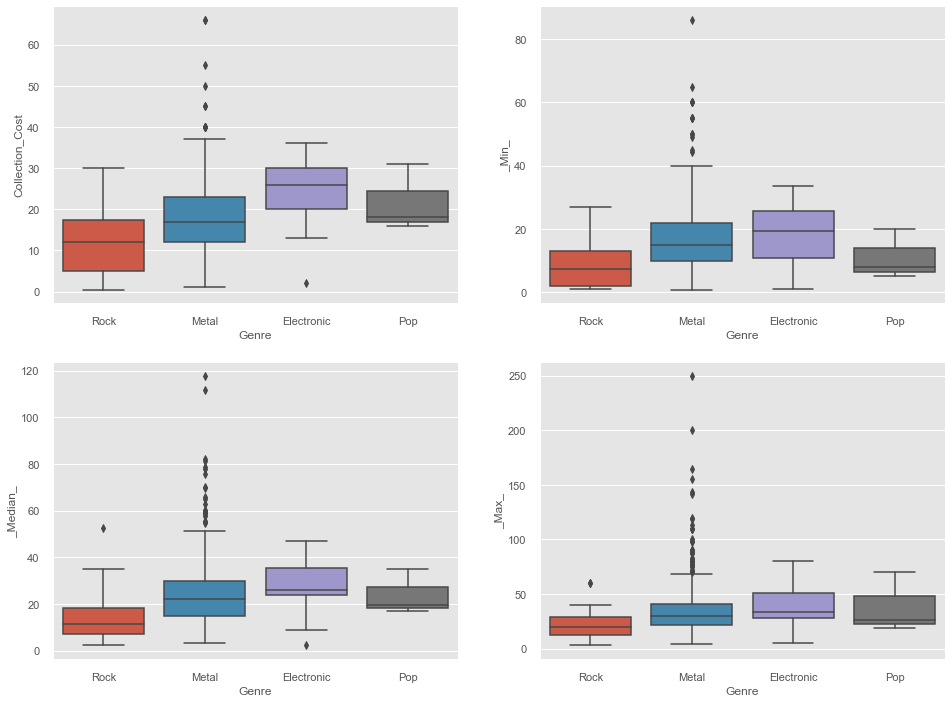

In [169]:
fig, axes = plt.subplots(2, 2)

ax = sns.boxplot(x="Genre", y="Collection_Cost", data=genre_reduced_df, orient='v', 
    ax=axes[0, 0])
ax = sns.boxplot(x="Genre", y="_Min_", data=genre_reduced_df, orient='v', 
    ax=axes[0, 1])
ax = sns.boxplot(x="Genre", y="_Median_", data=genre_reduced_df, orient='v', 
    ax=axes[1, 0])
ax = sns.boxplot(x="Genre", y="_Max_", data=genre_reduced_df, orient='v', 
    ax=axes[1, 1])

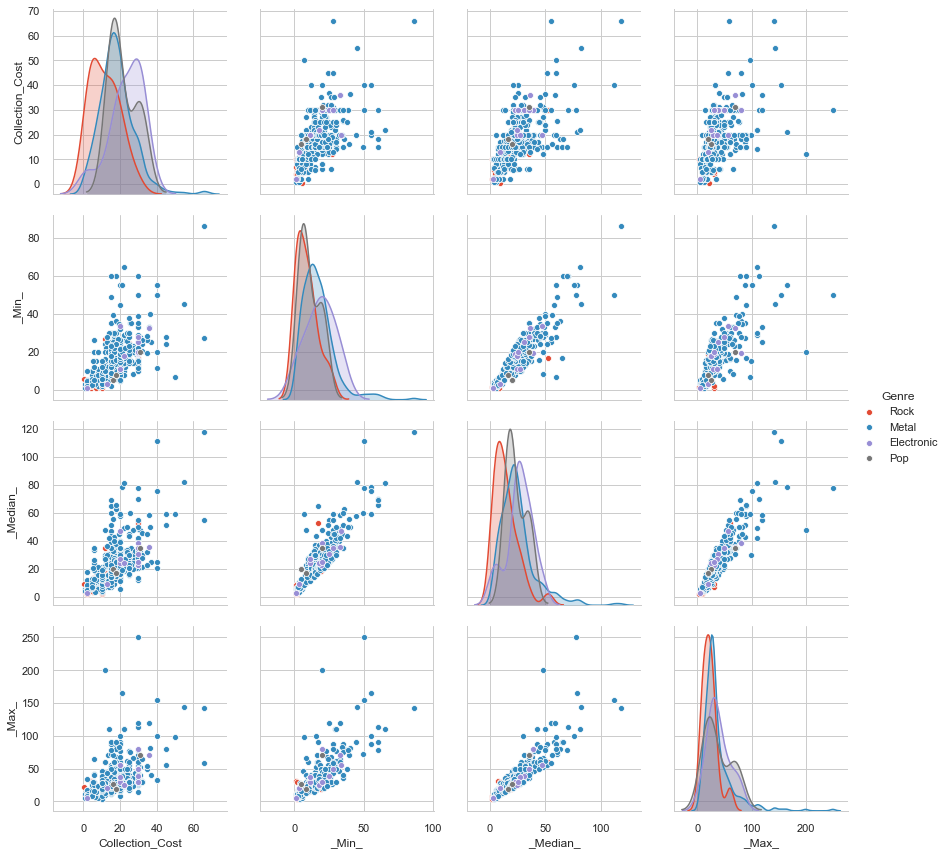

In [170]:
sns.set_style('whitegrid')
sns.pairplot(genre_reduced_df[['Genre','Collection_Cost','_Min_','_Median_','_Max_']],hue='Genre',size=3)
plt.show()

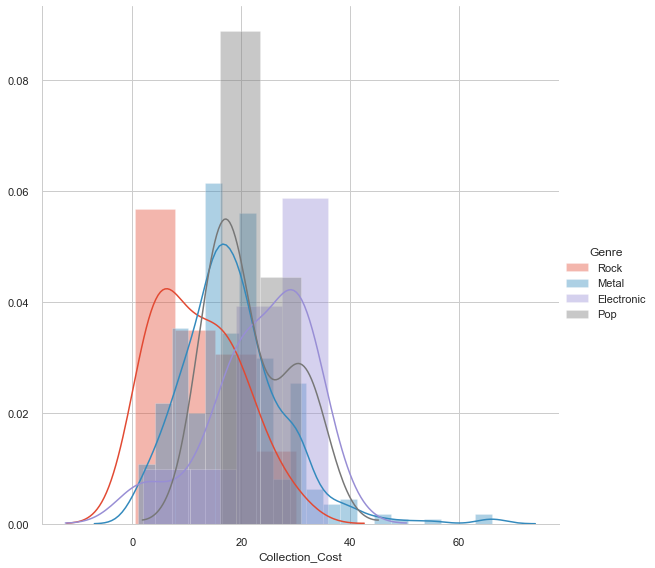

In [171]:
sns.FacetGrid(genre_reduced_df,hue="Genre",size=8).map(sns.distplot,
'Collection_Cost').add_legend()
plt.show()

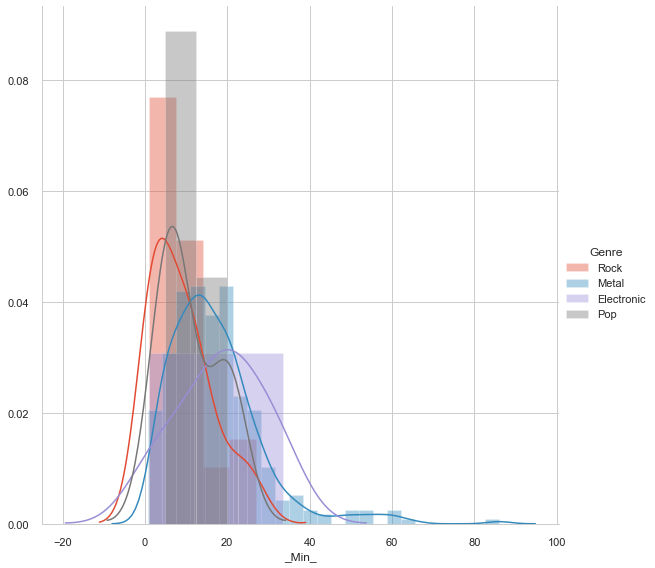

In [172]:
sns.FacetGrid(genre_reduced_df,hue="Genre",size=8).map(sns.distplot,
'_Min_').add_legend()
plt.show()

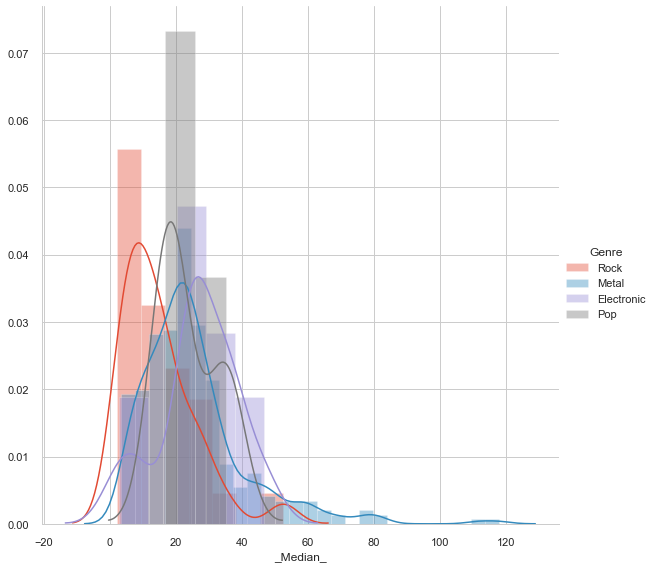

In [173]:
sns.FacetGrid(genre_reduced_df,hue="Genre",size=8).map(sns.distplot,
'_Median_').add_legend()
plt.show()

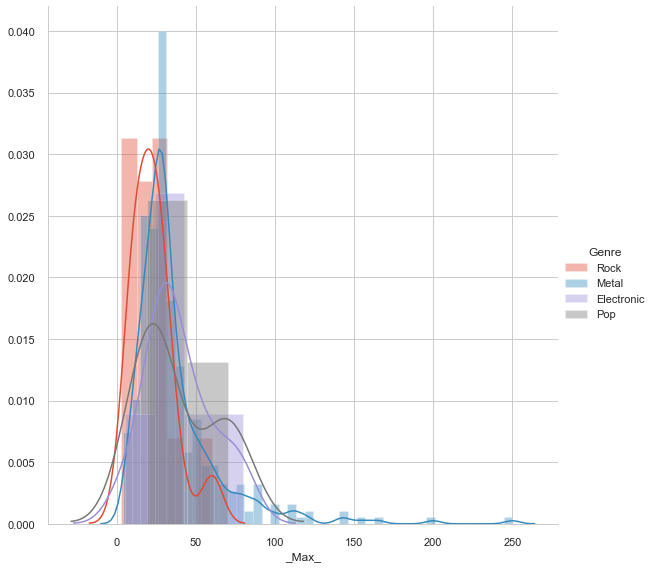

In [174]:
sns.FacetGrid(genre_reduced_df,hue="Genre",size=8).map(sns.distplot,
'_Max_').add_legend()
plt.show()

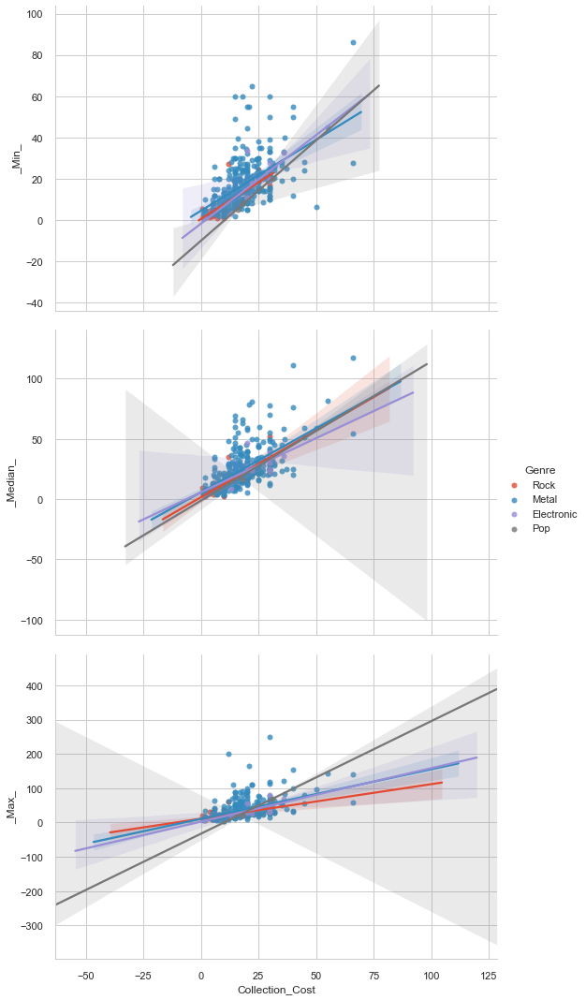

In [175]:
sns.pairplot(genre_reduced_df, x_vars=["Collection_Cost"], y_vars=['_Min_','_Median_','_Max_'],
             hue="Genre", height=5, aspect=1.5, kind="reg");

## Subgenre Analysis

In [176]:
discogs_df.Subgenre.value_counts()

Black Metal              83
Progressive Metal        62
Post Metal               61
Djent                    26
Sludge Metal             26
Death Metal              21
Doom Metal               17
Grindcore                16
Technical Death Metal    15
Hardcore                 13
Outrun                    9
Progressive Rock          7
Heavy Metal               7
Alternative Rock          6
Thrash Metal              5
Classic Rock              3
Grunge                    3
Folk                      3
Synthpop                  3
Hip Hop                   2
Psychdelic                2
Pop                       2
Post Hardcore             2
Shoegaze                  2
Stoner Metal              2
Melodic Death Metal       2
Synthwave                 1
Rock                      1
Post Rock                 1
Noise Rock                1
Gothic Metal              1
Jazz                      1
Metalcore                 1
Name: Subgenre, dtype: int64

In [177]:
subgenre_reduced = discogs_df['Subgenre'].value_counts()[lambda x: x>5].index.tolist()
subgenre_reduced

['Black Metal',
 'Progressive Metal',
 'Post Metal',
 'Djent',
 'Sludge Metal',
 'Death Metal',
 'Doom Metal',
 'Grindcore',
 'Technical Death Metal',
 'Hardcore',
 'Outrun',
 'Progressive Rock',
 'Heavy Metal',
 'Alternative Rock']

In [178]:
subgenre_reduced_df = discogs_df[(discogs_df['Subgenre'].isin(subgenre_reduced)) & (discogs_df.Collection_Cost < 200)]
subgenre_reduced_df.head()

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Released,release_id,CollectionFolder,Date_Added,Collection_Cost,Collection_Autographed,_Min_,_Median_,_Max_,Genre,Subgenre,Label1,Label2,Label3,Label4,Record
0,33,SD 8283,Yes,Yes,The Yes Album,Atlantic,"LP, Album, RE, PR;",1971,7116823.0,Vinyl,07/2019,5.5,No,2.25,3.87,10.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - The Yes Album
1,165,RR 6583-1,Mastodon,Mastodon,Remission,Relapse Records,"2x12"", Album, RE, RM, RP",2017,8863478.0,Vinyl,12/2016,15.0,No,7.99,21.67,30.19,Metal,Sludge Metal,Relapse Records,None,None,None,Mastodon - Remission
3,142,SD 3-100,Yes,Yes,Yessongs,Atlantic,"3xLP, Album",1973,8179158.0,Vinyl,04/2017,5.0,No,3.95,9.99,20.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Yessongs
4,18,SD 2-908,Yes,Yes,Tales From Topographic Oceans,Atlantic,"2xLP, Album, Gat",1973,8535940.0,Vinyl,02/2020,5.5,No,7.99,13.49,20.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Tales From Topographic Oceans
5,340,SD 18122,Yes,Yes,Relayer,Atlantic,"LP, Album, Gat",1974,755646.0,Vinyl,09/2014,4.0,No,1.13,7.00,30.74,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Relayer


## Boxplot Subgenre by Collection_Cost, Min, Median, and Max

[Text(0, 0, 'Progressive Rock'),
 Text(0, 0, 'Sludge Metal'),
 Text(0, 0, 'Heavy Metal'),
 Text(0, 0, 'Progressive Metal'),
 Text(0, 0, 'Hardcore'),
 Text(0, 0, 'Post Metal'),
 Text(0, 0, 'Alternative Rock'),
 Text(0, 0, 'Grindcore'),
 Text(0, 0, 'Black Metal'),
 Text(0, 0, 'Doom Metal'),
 Text(0, 0, 'Djent'),
 Text(0, 0, 'Technical Death Metal'),
 Text(0, 0, 'Death Metal'),
 Text(0, 0, 'Outrun')]

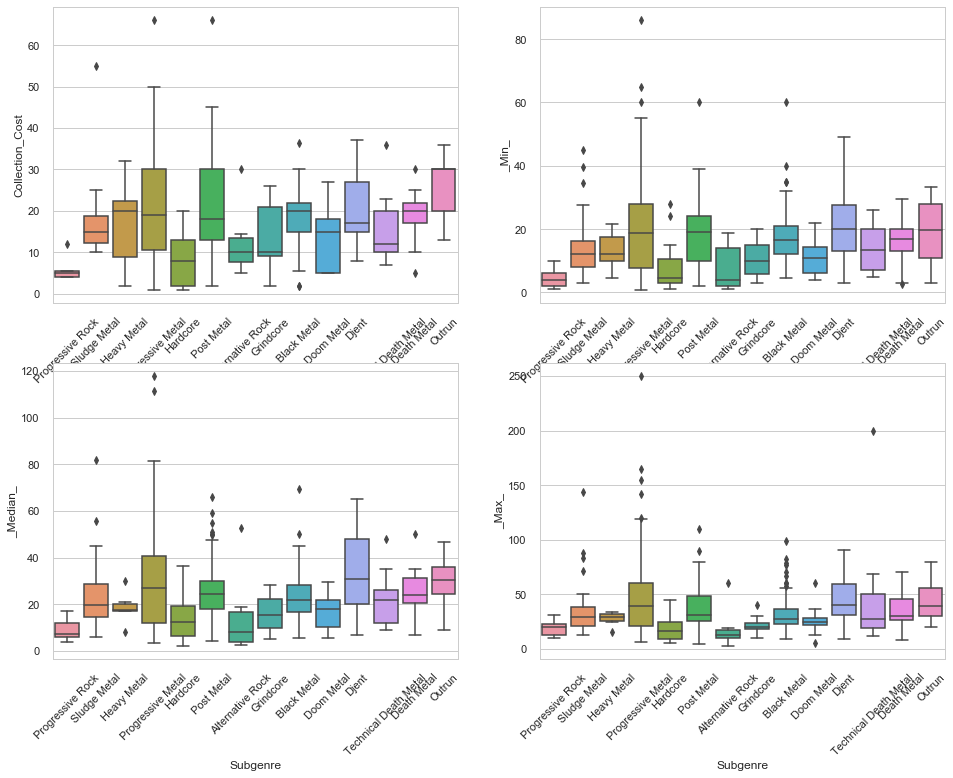

In [179]:
fig, axes = plt.subplots(2, 2)

ax = sns.boxplot(x="Subgenre", y="Collection_Cost", data=subgenre_reduced_df, orient='v', 
    ax=axes[0, 0])
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax = sns.boxplot(x="Subgenre", y="_Min_", data=subgenre_reduced_df, orient='v', 
    ax=axes[0, 1])
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax = sns.boxplot(x="Subgenre", y="_Median_", data=subgenre_reduced_df, orient='v', 
    ax=axes[1, 0])
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax = sns.boxplot(x="Subgenre", y="_Max_", data=subgenre_reduced_df, orient='v', 
    ax=axes[1, 1])
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)

Reduce to Top 5 subgenres

In [180]:
subgenre_reduced1 = discogs_df['Subgenre'].value_counts()[lambda x: x>25].index.tolist()
subgenre_reduced_df1 = discogs_df[(discogs_df['Subgenre'].isin(subgenre_reduced1)) & (discogs_df.Collection_Cost < 200)]

In [181]:
subgenre_reduced_df1.head()

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Released,release_id,CollectionFolder,Date_Added,Collection_Cost,Collection_Autographed,_Min_,_Median_,_Max_,Genre,Subgenre,Label1,Label2,Label3,Label4,Record
1,165,RR 6583-1,Mastodon,Mastodon,Remission,Relapse Records,"2x12"", Album, RE, RM, RP",2017,8863478.0,Vinyl,12/2016,15.0,No,7.99,21.67,30.19,Metal,Sludge Metal,Relapse Records,None,None,None,Mastodon - Remission
14,275,RR 6427-2,The Dillinger Escape Plan,The Dillinger Escape Plan,Calculating Infinity,Relapse Records,"CD, Album",1999,5536513.0,CD,06/2015,1.0,No,0.86,5.51,11.99,Metal,Progressive Metal,Relapse Records,None,None,None,The Dillinger Escape Plan - Calculating Infinity
16,375,IPC-32,Isis (6),Isis (6),Oceanic,Ipecac Recordings,"CD, Album",2002,376473.0,CD,03/2014,7.0,No,4.58,6.33,12.97,Metal,Post Metal,Ipecac Recordings,None,None,None,Isis (6) - Oceanic
18,146,TZ 7092,Kayo Dot,Kayo Dot,Choirs Of The Eye,Tzadik,"CD, Album, Cre",2003,649369.0,CD,04/2017,15.0,Yes,6.66,10.19,16.37,Metal,Progressive Metal,Tzadik,None,None,None,Kayo Dot - Choirs Of The Eye
20,325,IPC-57,Isis (6),Isis (6),Panopticon,Ipecac Recordings,"CD, Album",2004,377605.0,CD,11/2014,7.0,No,4.55,9.91,11.99,Metal,Post Metal,Ipecac Recordings,None,None,None,Isis (6) - Panopticon


## Boxplot Reduced Subgenre by Collection_Cost, Min, Median, and Max

[Text(0, 0, 'Sludge Metal'),
 Text(0, 0, 'Progressive Metal'),
 Text(0, 0, 'Post Metal'),
 Text(0, 0, 'Black Metal'),
 Text(0, 0, 'Djent')]

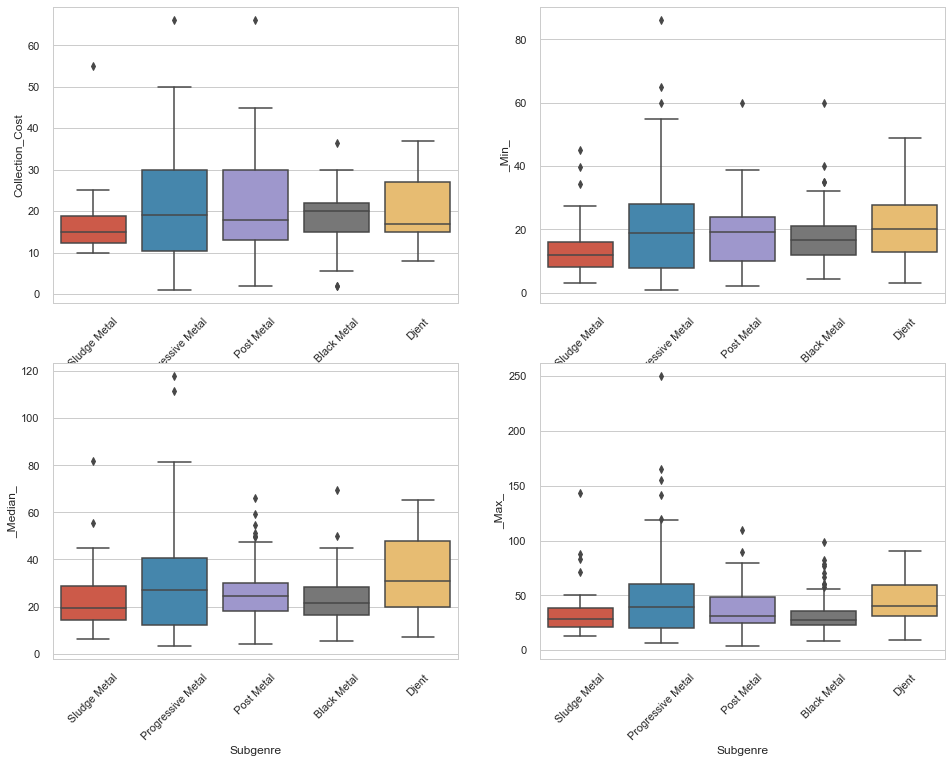

In [182]:
fig, axes = plt.subplots(2, 2)

ax = sns.boxplot(x="Subgenre", y="Collection_Cost", data=subgenre_reduced_df1, orient='v', 
    ax=axes[0, 0])
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax = sns.boxplot(x="Subgenre", y="_Min_", data=subgenre_reduced_df1, orient='v', 
    ax=axes[0, 1])
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax = sns.boxplot(x="Subgenre", y="_Median_", data=subgenre_reduced_df1, orient='v', 
    ax=axes[1, 0])
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax = sns.boxplot(x="Subgenre", y="_Max_", data=subgenre_reduced_df1, orient='v', 
    ax=axes[1, 1])
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)

## 3D Plot of Collection_Cost, Median, and Max

In [183]:
import plotly.express as px
fig = px.scatter_3d(subgenre_reduced_df1, x='Collection_Cost', y='_Median_', z='_Max_', color='Subgenre')
fig.show()

## Plot Collection_Cost vs Median by Subgenre

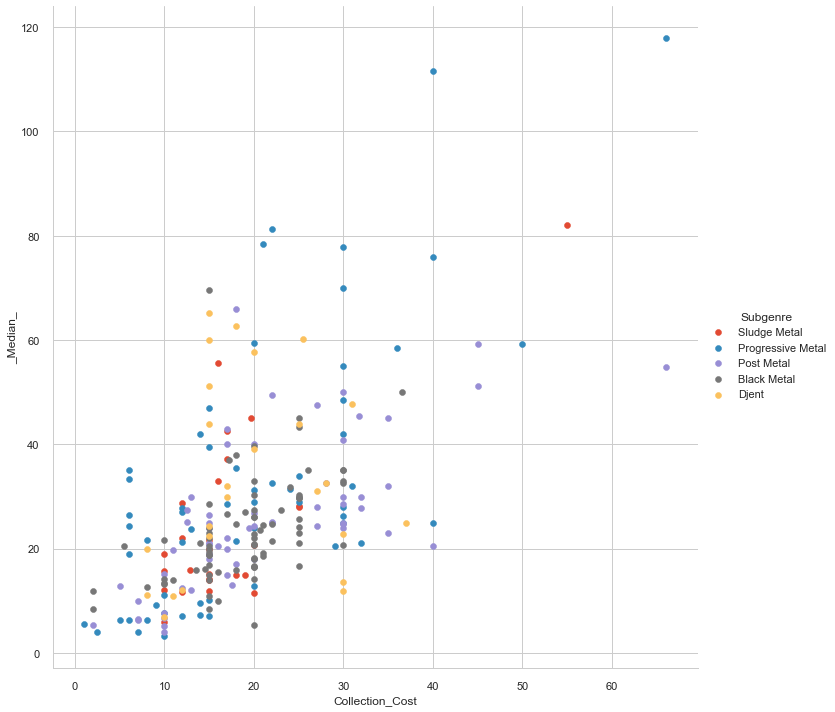

In [184]:
sns.set_style('whitegrid');
sns.FacetGrid(subgenre_reduced_df1,hue='Subgenre',size=10).map(plt.scatter,
'Collection_Cost','_Median_').add_legend();
plt.show();

## Plot Collection_Cost, Min, Median, and Max by Subgenre

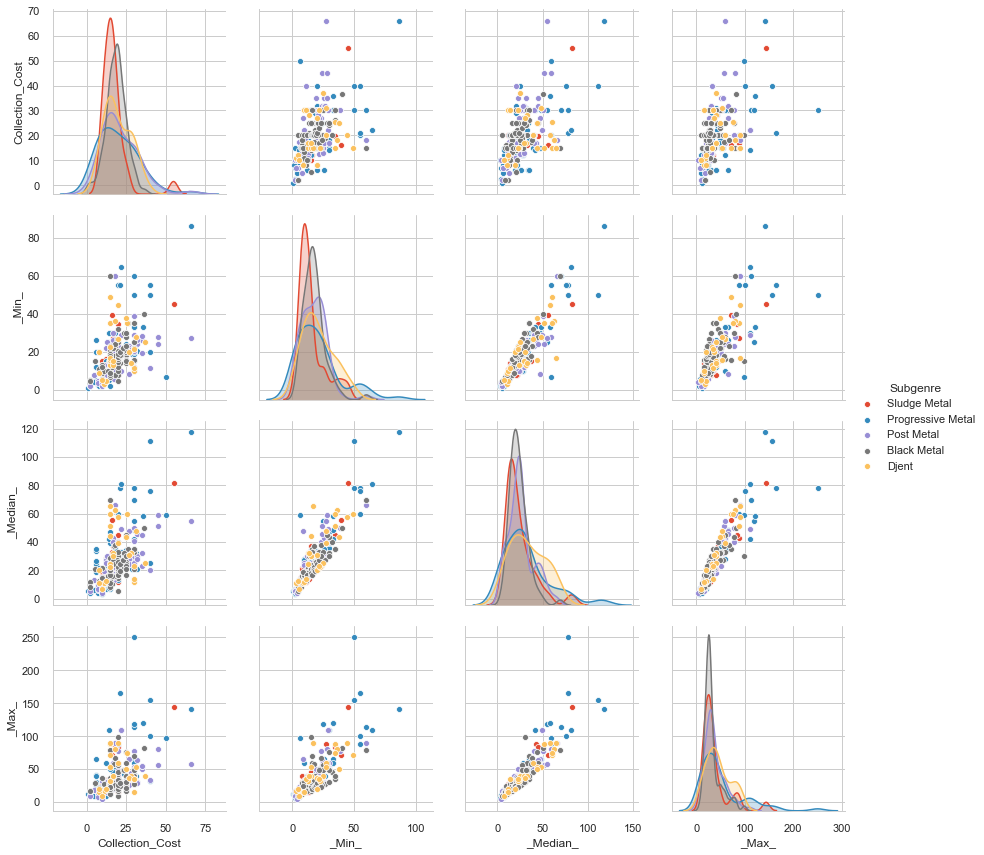

In [185]:
sns.set_style('whitegrid')
sns.pairplot(subgenre_reduced_df1[['Subgenre','Collection_Cost','_Min_','_Median_','_Max_']],hue='Subgenre',size=3)
plt.show()

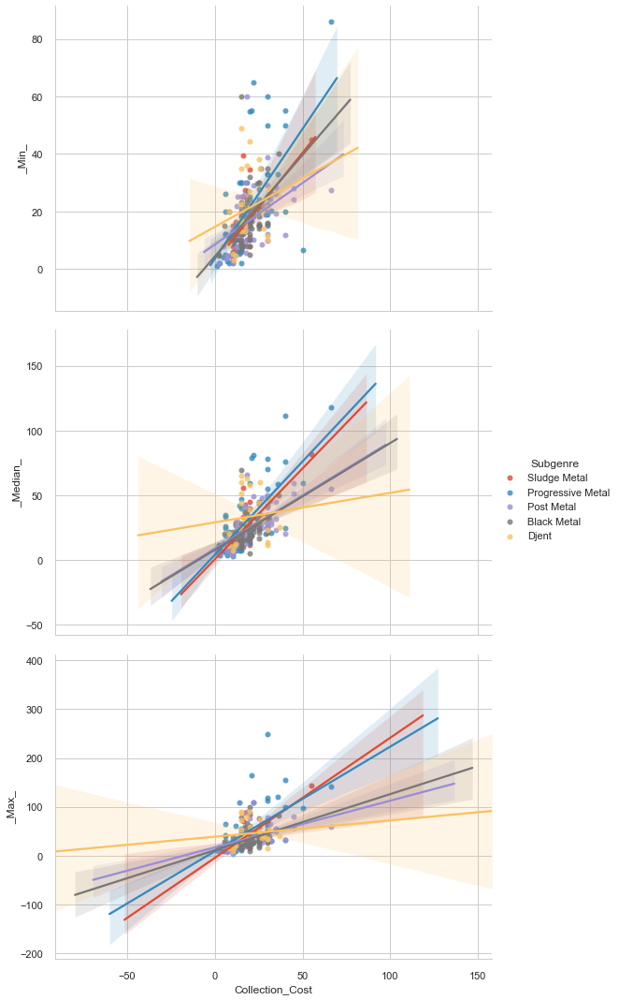

In [186]:
sns.pairplot(subgenre_reduced_df1, x_vars=["Collection_Cost"], y_vars=['_Min_','_Median_','_Max_'],
             hue="Subgenre", height=5, aspect=1.5, kind="reg");

## Distribution Plot Collection Cost by Subgenre

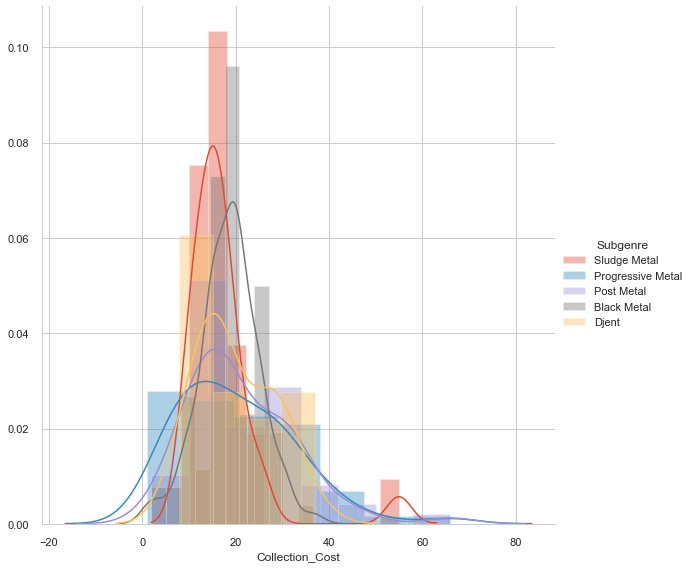

In [187]:
sns.FacetGrid(subgenre_reduced_df1,hue="Subgenre",size=8).map(sns.distplot,
'Collection_Cost').add_legend()
plt.show()

## Distribution plot Min by Subgenre

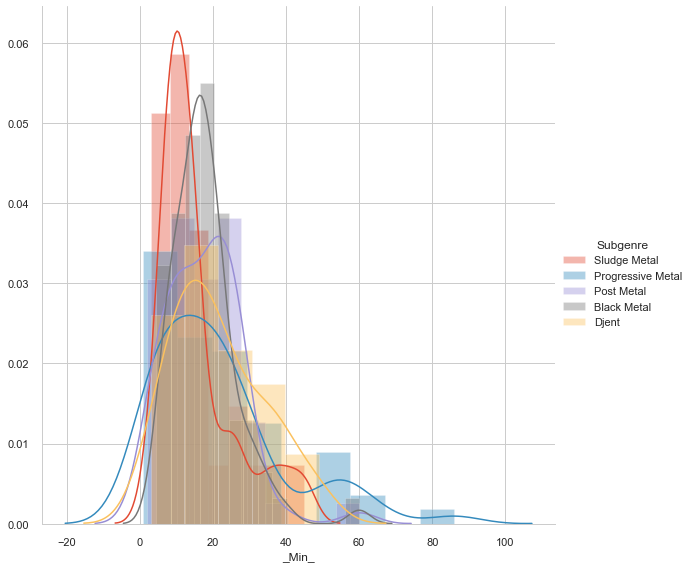

In [188]:
sns.FacetGrid(subgenre_reduced_df1,hue="Subgenre",size=8).map(sns.distplot,
'_Min_').add_legend()
plt.show()

## Distribution Plot Median by Subgenre

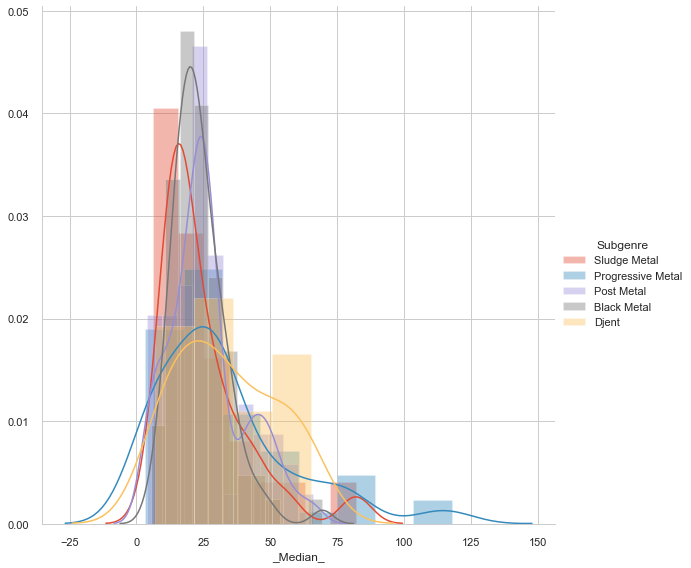

In [189]:
sns.FacetGrid(subgenre_reduced_df1,hue="Subgenre",size=8).map(sns.distplot,
'_Median_').add_legend()
plt.show()

## Distribution Plot Max by Subgenre

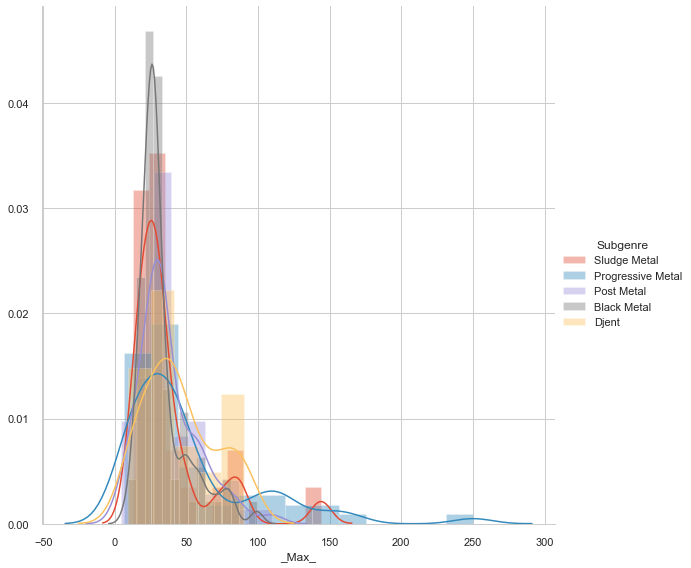

In [190]:
sns.FacetGrid(subgenre_reduced_df1,hue="Subgenre",size=8).map(sns.distplot,
'_Max_').add_legend()
plt.show()

# Format Analysis

### What are my top 10 valuable records by format?

In [191]:
format_df = discogs_df[(discogs_df.CollectionFolder != 'Tape') & (discogs_df.Collection_Cost < 200)]

In [192]:
format_df1 = discogs_df[(discogs_df.CollectionFolder != 'Tape')]
format_top20_df = format_df1.sort_values("_Median_",ascending = False).groupby('CollectionFolder').head(20)

format_top20_df[['CollectionFolder','Record','Genre','Subgenre',
                 'Collection_Autographed','Collection_Cost','_Median_']]

,CollectionFolder,Record,Genre,Subgenre,Collection_Autographed,Collection_Cost,_Median_
302,Vinyl,Meshuggah - 25 Years Of Musical Deviance,Metal,Djent,No,232.0,514.17
54,Vinyl,Opeth - In Live Concert At The Royal Albert Hall,Metal,Progressive Metal,No,66.0,117.83
202,Vinyl,Leprous - Bilateral,Metal,Progressive Metal,Yes,40.0,111.52
201,Vinyl,Mastodon - Remission,Metal,Sludge Metal,No,55.0,81.97
142,Vinyl,Haken (2) - The Mountain,Metal,Progressive Metal,Yes,22.0,81.20
140,Vinyl,Between The Buried And Me - The Anatomy Of,Metal,Progressive Metal,No,21.0,78.50
203,Vinyl,Ne Obliviscaris - Portal Of I,Metal,Progressive Metal,Yes,30.0,77.81
141,Vinyl,Opeth - Heritage,Metal,Progressive Metal,Yes,40.0,75.92
86,Vinyl,Between The Buried And Me - The Parallax II: F...,Metal,Progressive Metal,No,30.0,70.00
341,Vinyl,Yellow Eyes (2) - Immersion Trench Reverie,Metal,Black Metal,No,15.0,69.50


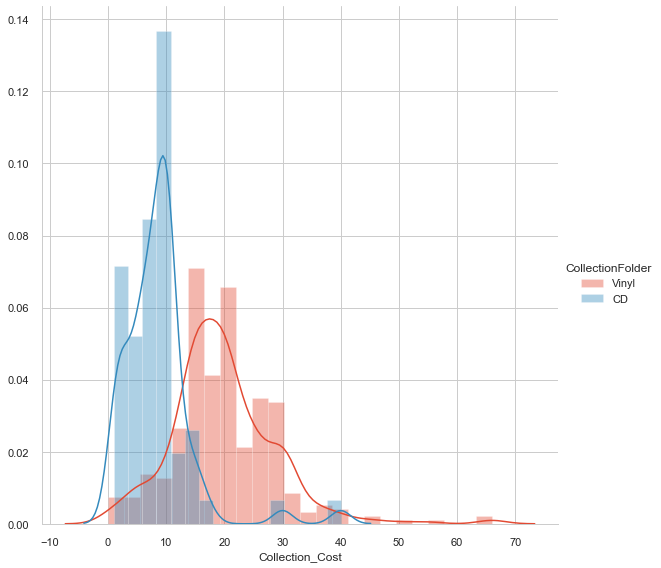

In [193]:
sns.FacetGrid(format_df,hue="CollectionFolder",size=8).map(sns.distplot,'Collection_Cost').add_legend()
plt.show()

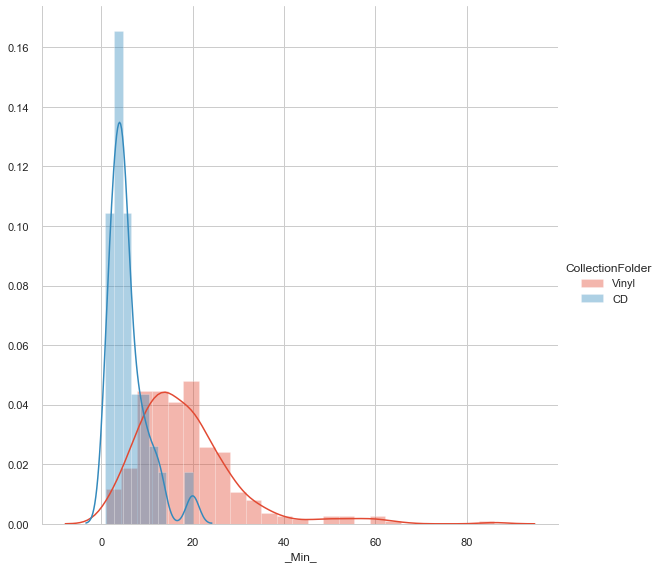

In [194]:
sns.FacetGrid(format_df,hue="CollectionFolder",size=8).map(sns.distplot,'_Min_').add_legend()
plt.show()

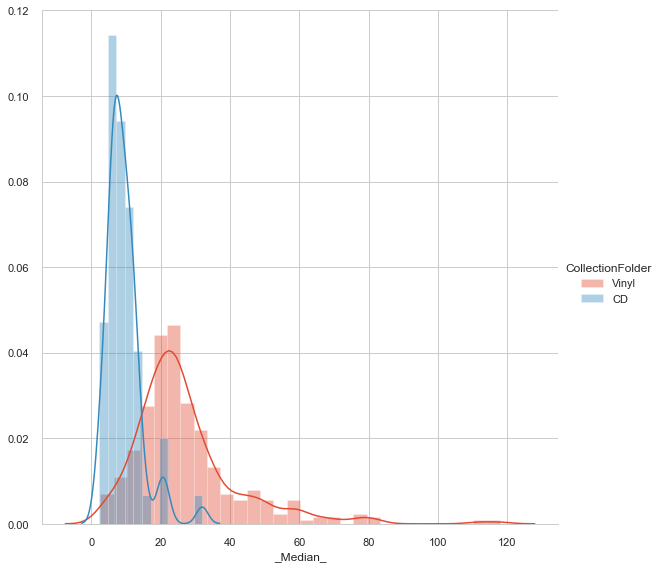

In [195]:
sns.FacetGrid(format_df,hue="CollectionFolder",size=8).map(sns.distplot,'_Median_').add_legend()
plt.show()

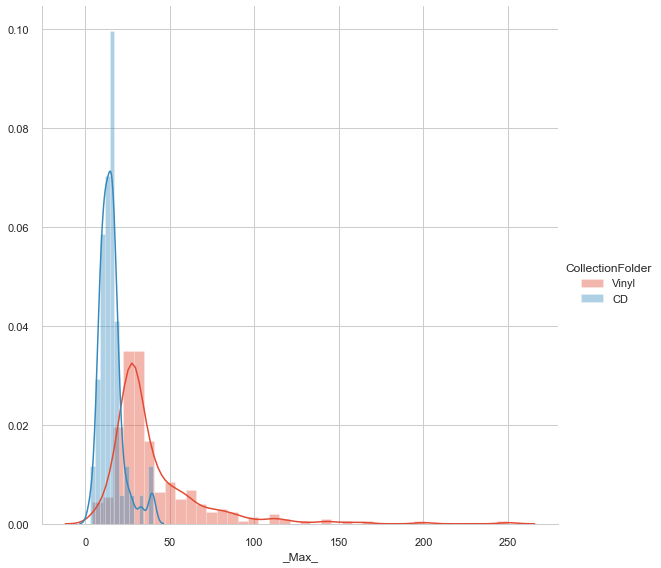

In [196]:
sns.FacetGrid(format_df,hue="CollectionFolder",size=8).map(sns.distplot,'_Max_').add_legend()
plt.show()

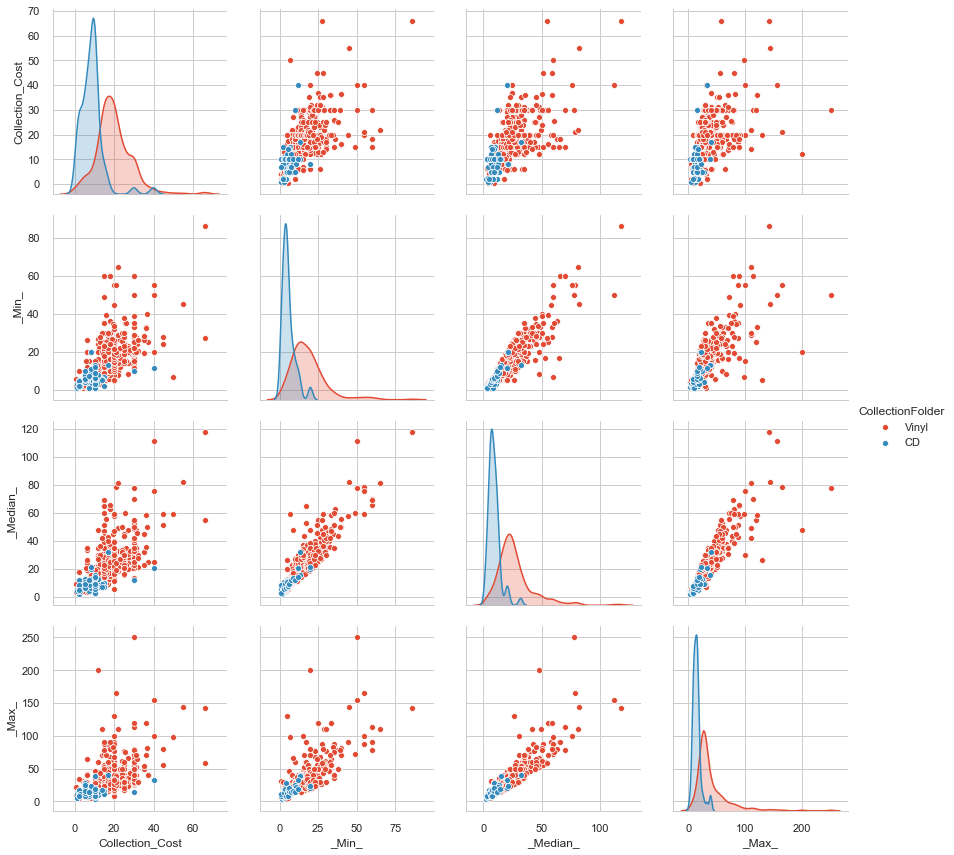

In [197]:
sns.set_style('whitegrid')
sns.pairplot(format_df[['CollectionFolder','Collection_Cost','_Min_','_Median_','_Max_']],hue='CollectionFolder',size=3)
plt.show()

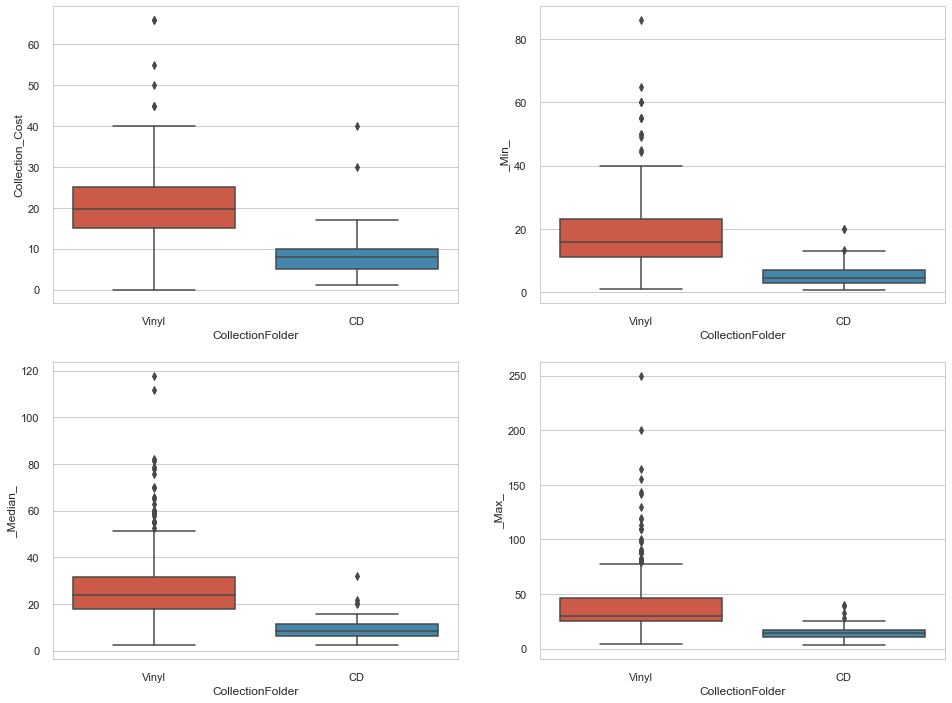

In [198]:
fig, axes = plt.subplots(2, 2)

ax = sns.boxplot(x="CollectionFolder", y="Collection_Cost", data=format_df, orient='v', 
    ax=axes[0, 0])
ax = sns.boxplot(x="CollectionFolder", y="_Min_", data=format_df, orient='v', 
    ax=axes[0, 1])
ax = sns.boxplot(x="CollectionFolder", y="_Median_", data=format_df, orient='v', 
    ax=axes[1, 0])
ax = sns.boxplot(x="CollectionFolder", y="_Max_", data=format_df, orient='v', 
    ax=axes[1, 1])

# Autographed Analysis

In [199]:
auto_df = discogs_df[(discogs_df.Collection_Autographed == 'Yes')]
auto_top20_df = auto_df.sort_values("_Max_",ascending = False).groupby('CollectionFolder').head(10)

auto_top20_df[['CollectionFolder','Record','Genre','Subgenre',
                 'Collection_Autographed','Collection_Cost','_Min_','_Median_','_Max_']]

,CollectionFolder,Record,Genre,Subgenre,Collection_Autographed,Collection_Cost,_Min_,_Median_,_Max_
203,Vinyl,Ne Obliviscaris - Portal Of I,Metal,Progressive Metal,Yes,30.0,50.00,77.81,250.00
202,Vinyl,Leprous - Bilateral,Metal,Progressive Metal,Yes,40.0,50.00,111.52,155.02
199,Vinyl,Isis (6) - Oceanic,Metal,Post Metal,Yes,22.0,29.00,49.49,109.89
142,Vinyl,Haken (2) - The Mountain,Metal,Progressive Metal,Yes,22.0,64.84,81.20,109.88
141,Vinyl,Opeth - Heritage,Metal,Progressive Metal,Yes,40.0,54.95,75.92,100.00
186,Vinyl,The Contortionist (2) - Language,Metal,Djent,Yes,15.0,17.00,65.11,89.95
139,Vinyl,Leprous - Coal,Metal,Progressive Metal,Yes,20.0,54.93,59.44,87.91
280,Vinyl,Perturbator - The Uncanny Valley,Electronic,Outrun,Yes,30.0,19.63,38.70,79.99
127,Vinyl,Intronaut - Valley Of Smoke,Metal,Post Metal,Yes,20.0,22.99,40.00,76.92
128,Vinyl,Falls Of Rauros - The Light That Dwells In Rot...,Metal,Black Metal,Yes,18.0,23.07,37.92,66.91


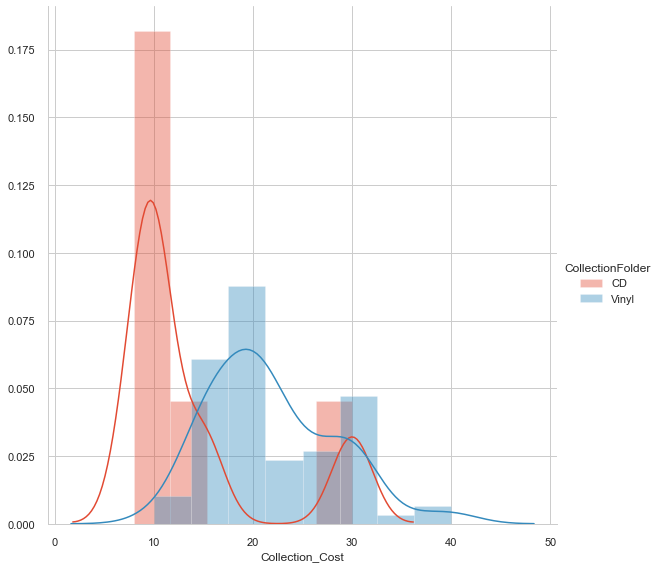

In [200]:
sns.FacetGrid(auto_df,hue="CollectionFolder",size=8).map(sns.distplot,'Collection_Cost').add_legend()
plt.show()

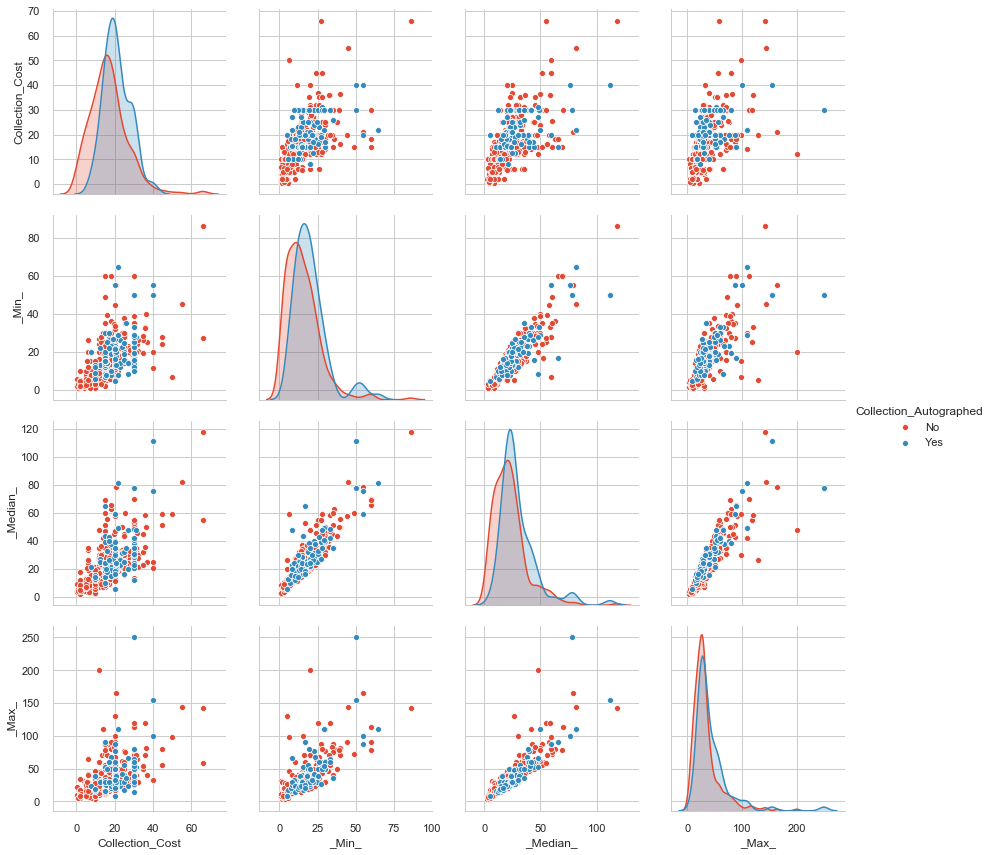

In [201]:
discogs_df1 = discogs_df[discogs_df.Collection_Cost < 200]

sns.set_style('whitegrid')
sns.pairplot(discogs_df1[['Collection_Autographed','Collection_Cost','_Min_','_Median_','_Max_']],hue='Collection_Autographed',size=3)
plt.show()

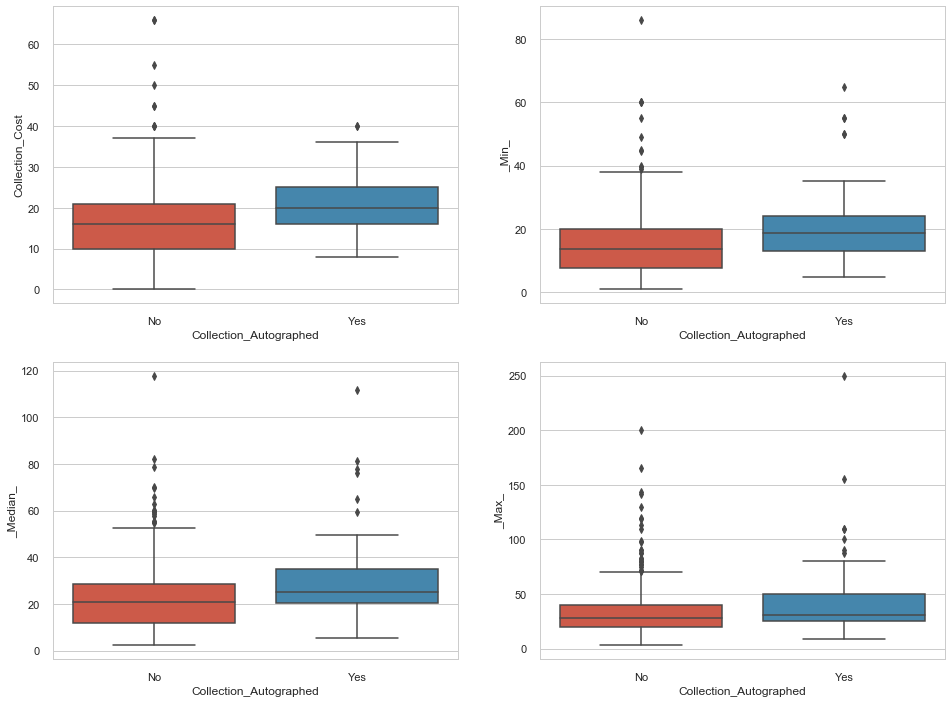

In [202]:
fig, axes = plt.subplots(2, 2)

ax = sns.boxplot(x="Collection_Autographed", y="Collection_Cost", data=discogs_df1, orient='v', 
    ax=axes[0, 0])
ax = sns.boxplot(x="Collection_Autographed", y="_Min_", data=discogs_df1, orient='v', 
    ax=axes[0, 1])
ax = sns.boxplot(x="Collection_Autographed", y="_Median_", data=discogs_df1, orient='v', 
    ax=axes[1, 0])
ax = sns.boxplot(x="Collection_Autographed", y="_Max_", data=discogs_df1, orient='v', 
    ax=axes[1, 1])

In [203]:
import plotly.express as px
fig = px.scatter(subgenre_reduced_df1, x="Collection_Cost", y="_Median_", color='Collection_Autographed', 
                 facet_col="Subgenre",hover_name="Subgenre",hover_data=["Artist2","Title","Record"])
fig.update_xaxes(matches=None)
fig.show()

In [204]:
fig = px.scatter(subgenre_reduced_df1[subgenre_reduced_df1.CollectionFolder != 'Tape'], 
                 x="Collection_Cost", y="_Median_", color='Collection_Autographed', 
                 facet_col="Subgenre",facet_row="CollectionFolder",
                 hover_name="Subgenre",hover_data=["Artist2","Title","Record"])
fig.update_xaxes(matches=None)
fig.show()

In [205]:
year_sub_df  = subgenre_reduced_df1.groupby(['Released','Subgenre']).agg({
                                         'Artist2': 'count',
                                         'Title': 'count',
                                         'Collection_Cost': 'sum',
                                         '_Min_': 'sum',
                                         '_Median_': 'sum',
                                         '_Max_': 'sum'
                                         }).reset_index().sort_values(by='Released',ascending=True)

# Round
year_sub_df.head()

,Released,Subgenre,Artist2,Title,Collection_Cost,_Min_,_Median_,_Max_
0,1999,Progressive Metal,1,1,1.0,0.86,5.51,11.99
1,2002,Post Metal,1,1,7.0,4.58,6.33,12.97
2,2003,Progressive Metal,1,1,15.0,6.66,10.19,16.37
3,2004,Post Metal,1,1,7.0,4.55,9.91,11.99
4,2004,Progressive Metal,1,1,6.0,4.99,6.40,19.00


In [206]:
year_sub_cost_df = year_sub_df.pivot("Released", "Subgenre", "Collection_Cost")
year_sub_cost_df.round(0).tail()

Subgenre,Black Metal,Djent,Post Metal,Progressive Metal,Sludge Metal
Released,,,,,
2016,194.0,28.0,285.0,197.0,36.0
2017,145.0,82.0,266.0,37.0,15.0
2018,207.0,NaN,79.0,NaN,75.0
2019,384.0,NaN,66.0,50.0,NaN
2020,36.0,NaN,NaN,NaN,NaN


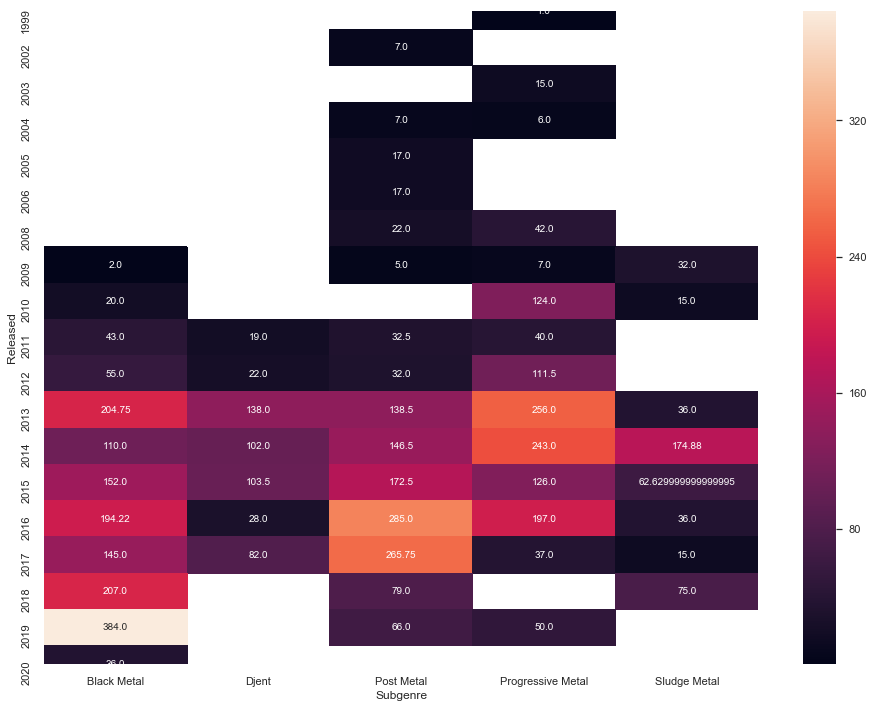

In [207]:
ax = sns.heatmap(year_sub_cost_df, annot=True, fmt="")

In [208]:
year_sub_title_df = year_sub_df.pivot("Released", "Subgenre", "Title")
year_sub_title_df.tail()

Subgenre,Black Metal,Djent,Post Metal,Progressive Metal,Sludge Metal
Released,,,,,
2016,11.0,1.0,11.0,7.0,2.0
2017,8.0,3.0,9.0,2.0,1.0
2018,9.0,NaN,3.0,NaN,5.0
2019,19.0,NaN,1.0,2.0,NaN
2020,2.0,NaN,NaN,NaN,NaN


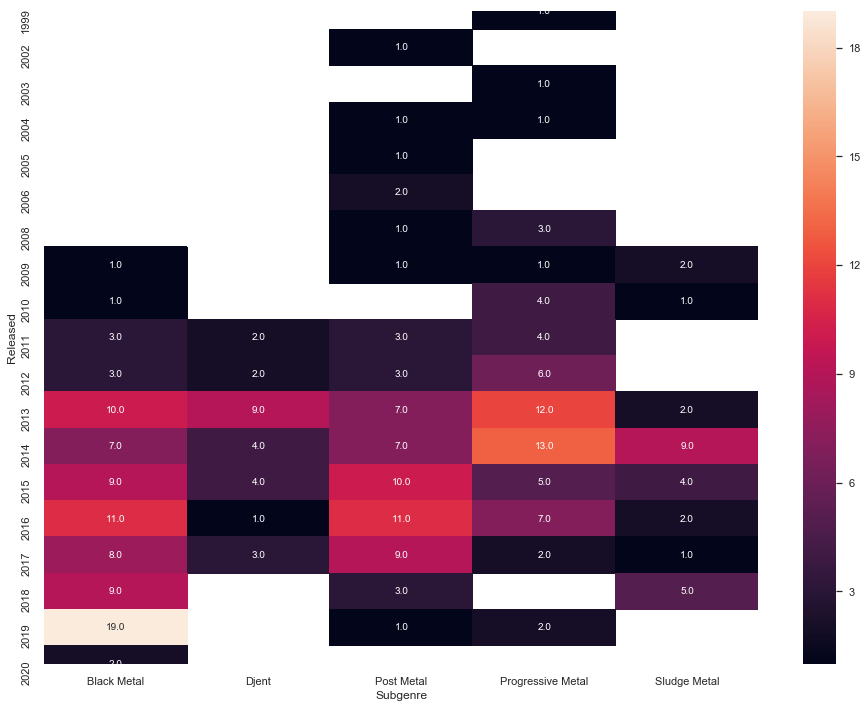

In [209]:
ax = sns.heatmap(year_sub_title_df, annot=True, fmt="")

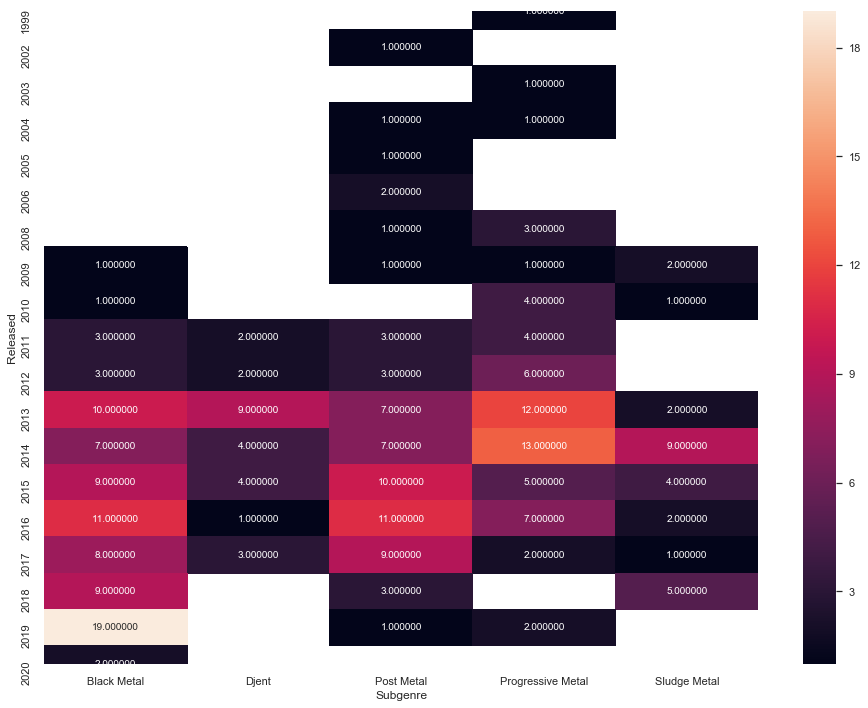

In [210]:
year_sub_title_df1 = year_sub_df.pivot("Released", "Subgenre", "Title")

ax = sns.heatmap(year_sub_title_df1, annot=True, fmt="f")

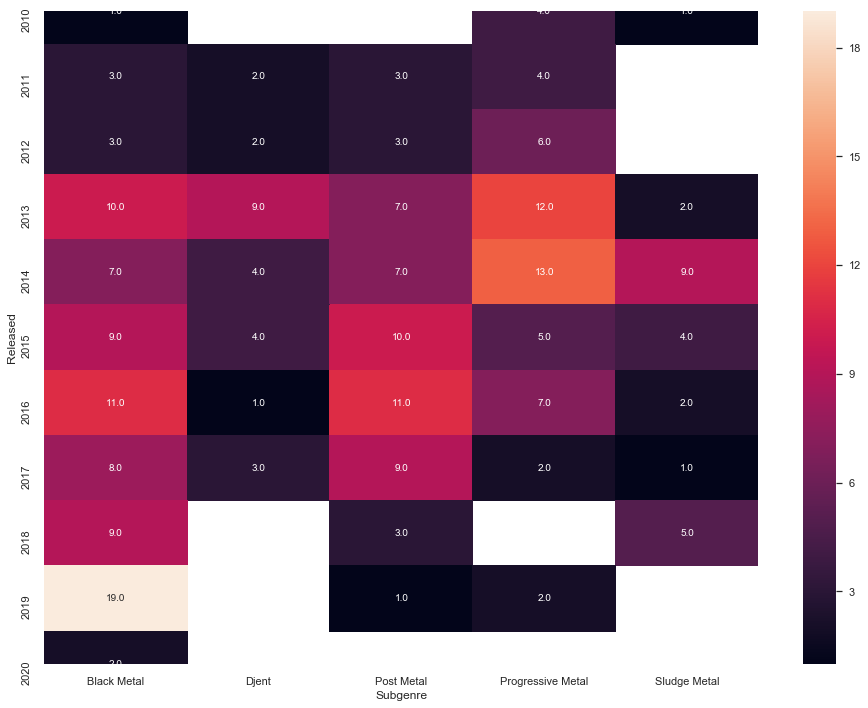

In [211]:
year_sub_title_df1 = year_sub_df[year_sub_df.Released >= 2010].pivot("Released", "Subgenre", "Title")
ax = sns.heatmap(year_sub_title_df1, annot=True, fmt="")

In [212]:
year_genre_df  = discogs_df.groupby(['Released','Genre']).agg({
                                     'Artist2': 'count',
                                     'Title': 'count',
                                     'Collection_Cost': 'sum',
                                     '_Min_': 'sum',
                                     '_Median_': 'sum',
                                     '_Max_': 'sum'
                                    }).reset_index().sort_values(by='Released',ascending=True)
year_genre_df.head()

,Released,Genre,Artist2,Title,Collection_Cost,_Min_,_Median_,_Max_
0,1961,Jazz,1,1,20.0,5.07,26.50,130.00
1,1971,Rock,1,1,5.5,2.25,3.87,10.00
2,1973,Rock,2,2,10.5,11.94,23.48,40.00
3,1974,Rock,1,1,4.0,1.13,7.00,30.74
4,1975,Rock,1,1,12.0,10.00,17.00,25.00


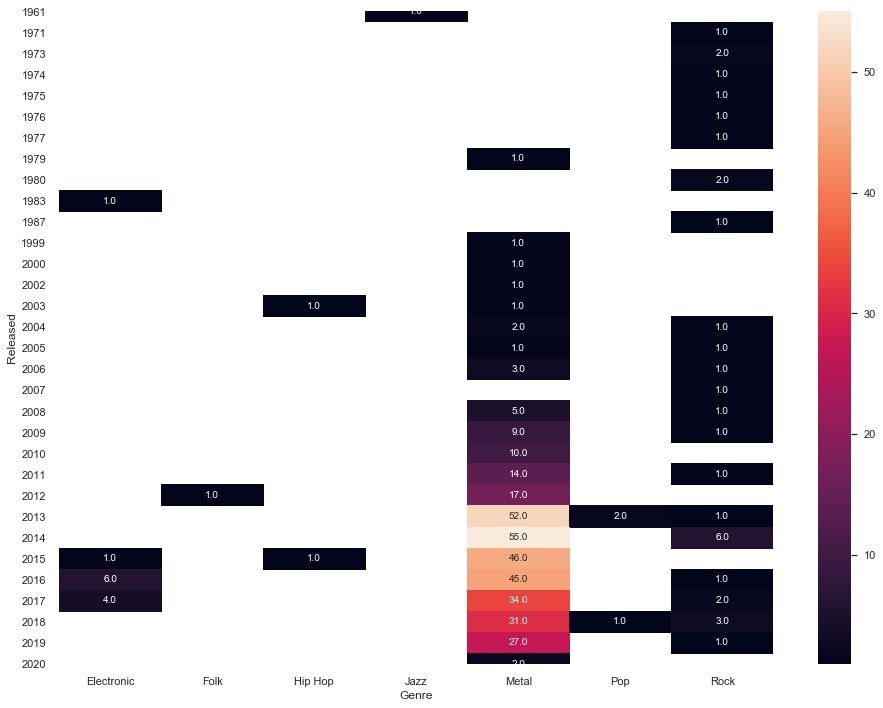

In [213]:
year_genre_title_df1 = year_genre_df.pivot("Released", "Genre", "Title")
ax = sns.heatmap(year_genre_title_df1, annot=True, fmt="")

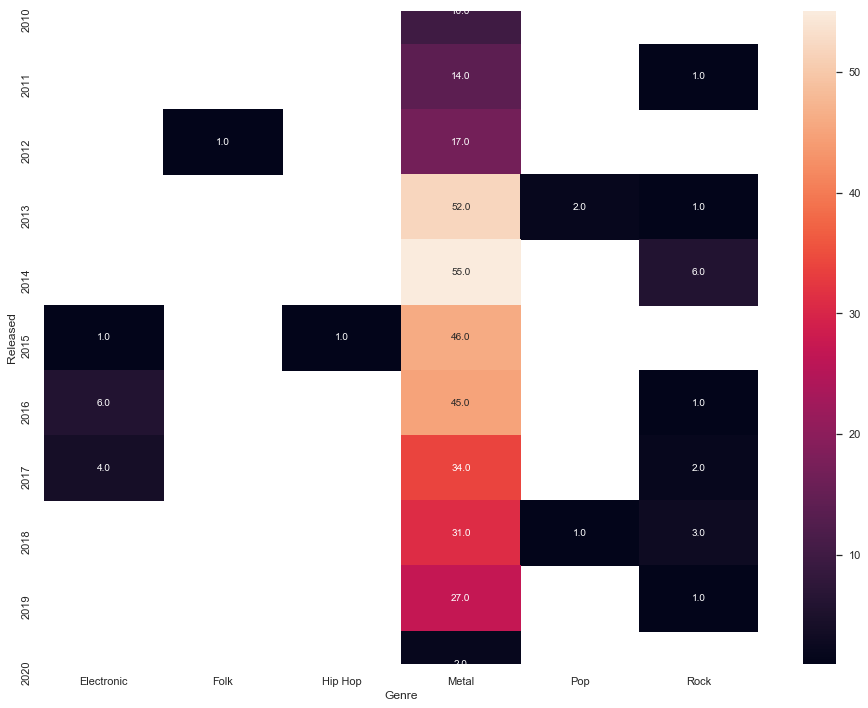

In [214]:
year_genre_title_df1 = year_genre_df[year_genre_df.Released >= 2010].pivot("Released", "Genre", "Title")
ax = sns.heatmap(year_genre_title_df1, annot=True, fmt="")

## Create animation for year

###  Example

In [215]:
df = px.data.gapminder()
df.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4


In [220]:
fig = px.bar(df, x="continent", y="pop", color="continent",
  animation_frame="year", animation_group="country",
             range_y=[0,4000000000])
fig.show()

In [221]:
fig = px.bar(df, y="continent", x="pop", color="continent",
  animation_frame="year", animation_group="country", orientation = 'h',
             range_x=[0,4000000000])
fig.show()

### Subgenre By Year

In [224]:
subgenre_reduced_df.head()

,ID,Catalog#,Artist,Artist2,Title,Label,Format,Released,release_id,CollectionFolder,Date_Added,Collection_Cost,Collection_Autographed,_Min_,_Median_,_Max_,Genre,Subgenre,Label1,Label2,Label3,Label4,Record
0,33,SD 8283,Yes,Yes,The Yes Album,Atlantic,"LP, Album, RE, PR;",1971,7116823.0,Vinyl,07/2019,5.5,No,2.25,3.87,10.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - The Yes Album
1,165,RR 6583-1,Mastodon,Mastodon,Remission,Relapse Records,"2x12"", Album, RE, RM, RP",2017,8863478.0,Vinyl,12/2016,15.0,No,7.99,21.67,30.19,Metal,Sludge Metal,Relapse Records,None,None,None,Mastodon - Remission
3,142,SD 3-100,Yes,Yes,Yessongs,Atlantic,"3xLP, Album",1973,8179158.0,Vinyl,04/2017,5.0,No,3.95,9.99,20.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Yessongs
4,18,SD 2-908,Yes,Yes,Tales From Topographic Oceans,Atlantic,"2xLP, Album, Gat",1973,8535940.0,Vinyl,02/2020,5.5,No,7.99,13.49,20.00,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Tales From Topographic Oceans
5,340,SD 18122,Yes,Yes,Relayer,Atlantic,"LP, Album, Gat",1974,755646.0,Vinyl,09/2014,4.0,No,1.13,7.00,30.74,Rock,Progressive Rock,Atlantic,None,None,None,Yes - Relayer


In [232]:
year_sub_df1  = subgenre_reduced_df.groupby(['Released','Subgenre']).agg({
                                         'Title': 'count',
                                         'Collection_Cost': 'sum',
                                         '_Min_': 'sum',
                                         '_Median_': 'sum',
                                         '_Max_': 'sum'
                                         }).reset_index().sort_values(by='Released',ascending=True)

# Round
year_sub_df1.head()

,Released,Subgenre,Title,Collection_Cost,_Min_,_Median_,_Max_
0,1971,Progressive Rock,1,5.5,2.25,3.87,10.00
1,1973,Progressive Rock,2,10.5,11.94,23.48,40.00
2,1974,Progressive Rock,1,4.0,1.13,7.00,30.74
3,1975,Progressive Rock,1,12.0,10.00,17.00,25.00
4,1977,Progressive Rock,1,4.0,4.50,7.25,14.00


In [237]:
year_sub_df1['Released'].unique()

array([1971, 1973, 1974, 1975, 1977, 1979, 1980, 1999, 2000, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017, 2018, 2019, 2020])

In [243]:
Released = pd.DataFrame({'Released':year_sub_df1['Released'].unique()})
Released

,Released
0,1971
1,1973
2,1974
3,1975
4,1977
5,1979
6,1980
7,1999
8,2000
9,2002


In [238]:
year_sub_df1['Subgenre'].unique()

array(['Progressive Rock', 'Heavy Metal', 'Progressive Metal', 'Hardcore',
       'Post Metal', 'Alternative Rock', 'Grindcore', 'Black Metal',
       'Sludge Metal', 'Doom Metal', 'Djent', 'Technical Death Metal',
       'Death Metal', 'Outrun'], dtype=object)

In [244]:
Subgenre = pd.DataFrame({'Subgenre':year_sub_df1['Subgenre'].unique()})
Subgenre

,Subgenre
0,Progressive Rock
1,Heavy Metal
2,Progressive Metal
3,Hardcore
4,Post Metal
5,Alternative Rock
6,Grindcore
7,Black Metal
8,Sludge Metal
9,Doom Metal


In [245]:
def cartesian_product_basic(left, right):
    return (
       left.assign(key=1).merge(right.assign(key=1), on='key').drop('key', 1))

In [248]:
released_subgenre_df = cartesian_product_basic(Released, Subgenre)
released_subgenre_df.head()

,Released,Subgenre
0,1971,Progressive Rock
1,1971,Heavy Metal
2,1971,Progressive Metal
3,1971,Hardcore
4,1971,Post Metal


Left Join released_subgenre_df on year_sub_df1

In [272]:
year_sub_df1.head()

,Released,Subgenre,Title,Collection_Cost,_Min_,_Median_,_Max_
0,1971,Progressive Rock,1,5.5,2.25,3.87,10.00
1,1973,Progressive Rock,2,10.5,11.94,23.48,40.00
2,1974,Progressive Rock,1,4.0,1.13,7.00,30.74
3,1975,Progressive Rock,1,12.0,10.00,17.00,25.00
4,1977,Progressive Rock,1,4.0,4.50,7.25,14.00


In [273]:
subgenre_df2 = released_subgenre_df.merge(year_sub_df1, on = ['Released','Subgenre'],how='left').fillna(0).sort_values(by=['Released','Subgenre'],ascending=True)
subgenre_df2.head()

,Released,Subgenre,Title,Collection_Cost,_Min_,_Median_,_Max_
5,1971,Alternative Rock,0.0,0.0,0.0,0.0,0.0
7,1971,Black Metal,0.0,0.0,0.0,0.0,0.0
12,1971,Death Metal,0.0,0.0,0.0,0.0,0.0
10,1971,Djent,0.0,0.0,0.0,0.0,0.0
9,1971,Doom Metal,0.0,0.0,0.0,0.0,0.0


In [271]:
subgenre_cum_df2 = subgenre_df2.groupby(['Released','Subgenre']).sum().groupby(['Subgenre']).cumsum().reset_index()
subgenre_cum_df2.head()

,Released,Subgenre,Title,Collection_Cost,_Min_,_Median_,_Max_
0,1971,Alternative Rock,0.0,0.0,0.0,0.0,0.0
1,1971,Black Metal,0.0,0.0,0.0,0.0,0.0
2,1971,Death Metal,0.0,0.0,0.0,0.0,0.0
3,1971,Djent,0.0,0.0,0.0,0.0,0.0
4,1971,Doom Metal,0.0,0.0,0.0,0.0,0.0


Start animations here

## Title vs. Subgenre by Year

In [281]:
fig = px.bar(subgenre_cum_df2, x="Title", y="Subgenre", color="Subgenre",
  animation_frame="Released", range_x=[0,90], orientation = 'h')
fig.show()

## Collection_Cost vs. Subgenre by Year

In [284]:
fig = px.bar(subgenre_cum_df2, x="Collection_Cost", y="Subgenre", color="Subgenre",
  animation_frame="Released", range_x=[0,1600], orientation = 'h')
fig.show()

## Median vs. Subgenre by Year

In [285]:
fig = px.bar(subgenre_cum_df2, x="_Median_", y="Subgenre", color="Subgenre",
  animation_frame="Released", range_x=[0,2000], orientation = 'h')
fig.show()

## Title vs. Collection Cost by Year

In [280]:
px.scatter(subgenre_cum_df2,x = 'Title', y = 'Collection_Cost',color='Subgenre',
               size='_Median_',animation_frame='Released', animation_group='Subgenre',range_x = [0,100],
              range_y = [0,2000],text='Subgenre')

## Scatterplot - Title vs. Collection Cost by Year

In [289]:
px.scatter(subgenre_cum_df2,x = 'Collection_Cost', y = '_Median_',color='Subgenre',
               size='Title',animation_frame='Released', animation_group='Subgenre',range_x = [0,2000],
              range_y = [0,2100],text='Subgenre')

Export data for Floursh

In [294]:
subgenre_cum_df2 = subgenre_cum_df2.sort_values(by=['Released','Collection_Cost'],ascending=[True,False])
subgenre_cum_df2.to_csv('../output/discogs_cum_sum_data.csv',index = False)

In [297]:
subgenre_cum_df2.set_index(['Released','Subgenre']).T

Released                    1971                                     \
Subgenre        Progressive Rock Technical Death Metal Sludge Metal   
Title                       1.00                   0.0          0.0   
Collection_Cost             5.50                   0.0          0.0   
_Min_                       2.25                   0.0          0.0   
_Median_                    3.87                   0.0          0.0   
_Max_                      10.00                   0.0          0.0   

Released                                                                  \
Subgenre        Progressive Metal Post Metal Outrun Heavy Metal Hardcore   
Title                         0.0        0.0    0.0         0.0      0.0   
Collection_Cost               0.0        0.0    0.0         0.0      0.0   
_Min_                         0.0        0.0    0.0         0.0      0.0   
_Median_                      0.0        0.0    0.0         0.0      0.0   
_Max_                         0.0        0.0    0.0         0.0      0.0   

Released                                                            \
Subgenre        Grindcore Doom Metal Djent Death Metal Black Metal   
Title                 0.0        0.0   0.0         0.0         0.0   
Collection_Cost       0.0        0.0   0.0         0.0         0.0   
_Min_                 0.0        0.0   0.0         0.0         0.0   
_Median_              0.0        0.0   0.0         0.0         0.0   
_Max_                 0.0        0.0   0.0         0.0         0.0   

Released                                     1973                        \
Subgenre        Alternative Rock Progressive Rock Technical Death Metal   
Title                        0.0             3.00                   0.0   
Collection_Cost              0.0            16.00                   0.0   
_Min_                        0.0            14.19                   0.0   
_Median_                     0.0            27.35                   0.0   
_Max_                        0.0            50.00                   0.0   

Released                                                                      \
Subgenre        Sludge Metal Progressive Metal Post Metal Outrun Heavy Metal   
Title                    0.0               0.0        0.0    0.0         0.0   
Collection_Cost          0.0               0.0        0.0    0.0         0.0   
_Min_                    0.0               0.0        0.0    0.0         0.0   
_Median_                 0.0               0.0        0.0    0.0         0.0   
_Max_                    0.0               0.0        0.0    0.0         0.0   

Released                                                                     \
Subgenre        Hardcore Grindcore Doom Metal Djent Death Metal Black Metal   
Title                0.0       0.0        0.0   0.0         0.0         0.0   
Collection_Cost      0.0       0.0        0.0   0.0         0.0         0.0   
_Min_                0.0       0.0        0.0   0.0         0.0         0.0   
_Median_             0.0       0.0        0.0   0.0         0.0         0.0   
_Max_                0.0       0.0        0.0   0.0         0.0         0.0   

Released                                     1974                        \
Subgenre        Alternative Rock Progressive Rock Technical Death Metal   
Title                        0.0             4.00                   0.0   
Collection_Cost              0.0            20.00                   0.0   
_Min_                        0.0            15.32                   0.0   
_Median_                     0.0            34.35                   0.0   
_Max_                        0.0            80.74                   0.0   

Released                                                                      \
Subgenre        Sludge Metal Progressive Metal Post Metal Outrun Heavy Metal   
Title                    0.0               0.0        0.0    0.0         0.0   
Collection_Cost          0.0               0.0        0.0    0.0       